In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov4_allmodels_cal.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 122 entries, PatientID to Solid
dtypes: bool(25), float64(83), int64(11), object(3)
memory usage: 12.3+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v4_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=True, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1172 entries, 4740 to 10150
Columns: 117 entries, PatientID to Solid
dtypes: bool(25), float64(80), int64(11), object(1)
memory usage: 880.1+ KB


In [5]:
MODEL_TO_COL = {
    "Venkadesh": "DL_cal",
    "de Haas Combined": "Thijmen_mean_cal",
    # "de Haas Local": "Thijmen_local_cal",
    # "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (w/nodule)": "Thijmen_global_show_cal",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

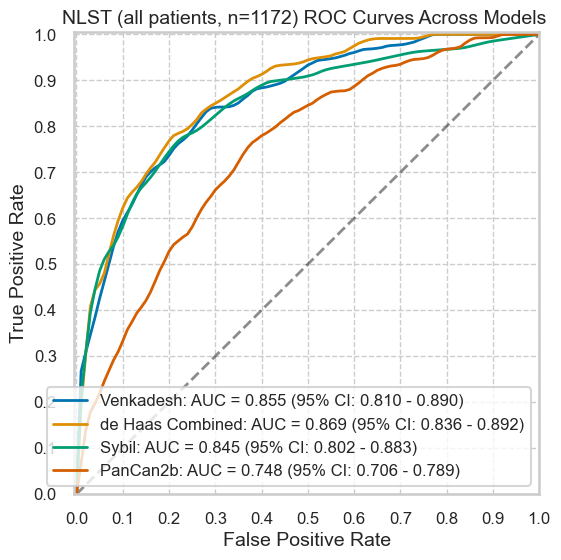

In [6]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

## Plot results by category

In [7]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, perfs, sigtestresults = utils.roc_cm_by_category(df, cat, MODEL_TO_COL)
    display(catinfo)
    
    if sigtestresults is not None:
        print("Hanley-McNeil significance test results:")
        display(sigtestresults)
    else:
        print("More than binary: not computing significance test results.")

    for m in perfs:
        print(m)
        display(perfs[m])

### Included columns (from predictions)

#### wrknomask

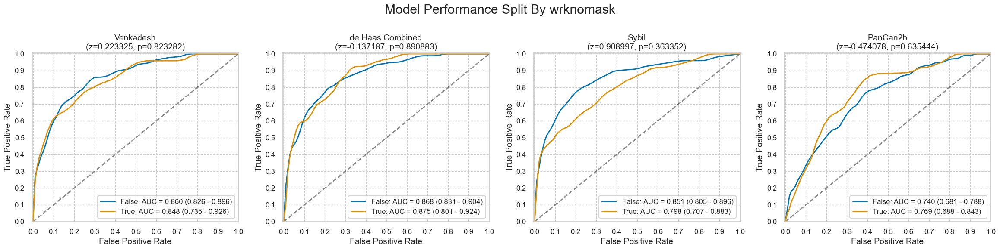

,num,pct,num_mal,pct_mal
False,872,74.40273,102,11.697248
True,300,25.59727,25,8.333333


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.223325,-0.137187,0.908997,-0.474078
p,0.823282,0.890883,0.363352,0.635444


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,872,102,770,87,255,515,15,0.852941,0.331169,0.147059,0.668831,0.254386,0.971698,0.745614,0.028302,0.690367,0.521772,0.391892,0.343459
True,300,25,275,20,81,194,5,0.800000,0.294545,0.200000,0.705455,0.198020,0.974874,0.801980,0.025126,0.713333,0.505455,0.317460,0.295618


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,872,102,770,92,313,457,10,0.901961,0.406494,0.098039,0.593506,0.227160,0.978587,0.772840,0.021413,0.629587,0.495467,0.362919,0.319282
True,300,25,275,23,94,181,2,0.920000,0.341818,0.080000,0.658182,0.196581,0.989071,0.803419,0.010929,0.680000,0.578182,0.323944,0.327629


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,872,102,770,59,70,700,43,0.578431,0.090909,0.421569,0.909091,0.457364,0.942127,0.542636,0.057873,0.870413,0.487522,0.510823,0.441317
True,300,25,275,12,26,249,13,0.480000,0.094545,0.520000,0.905455,0.315789,0.950382,0.684211,0.049618,0.870000,0.385455,0.380952,0.320307


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,872,102,770,64,230,540,38,0.627451,0.298701,0.372549,0.701299,0.217687,0.934256,0.782313,0.065744,0.692661,0.328750,0.323232,0.223498
True,300,25,275,16,71,204,9,0.640000,0.258182,0.360000,0.741818,0.183908,0.957746,0.816092,0.042254,0.733333,0.381818,0.285714,0.232565


#### FamilyHistoryLungCa

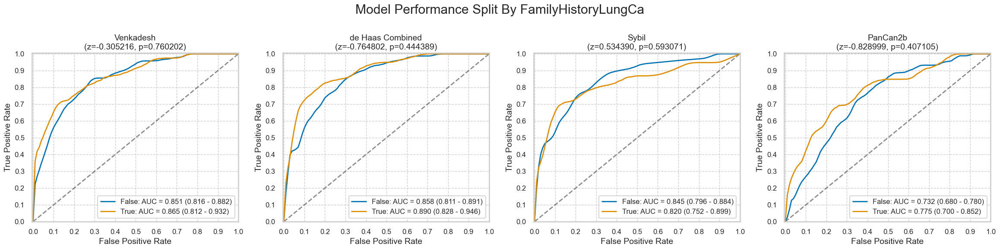

,num,pct,num_mal,pct_mal
False,870,74.232082,87,10.000000
True,302,25.767918,40,13.245033


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.305216,-0.764802,0.534390,-0.828999
p,0.760202,0.444389,0.593071,0.407105


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,870,87,783,74,255,528,13,0.850575,0.32567,0.149425,0.67433,0.224924,0.975970,0.775076,0.024030,0.691954,0.524904,0.355769,0.324731
True,302,40,262,33,81,181,7,0.825000,0.30916,0.175000,0.69084,0.289474,0.962766,0.710526,0.037234,0.708609,0.515840,0.428571,0.360715


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,870,87,783,78,304,479,9,0.896552,0.38825,0.103448,0.61175,0.204188,0.981557,0.795812,0.018443,0.640230,0.508301,0.332623,0.307270
True,302,40,262,37,103,159,3,0.925000,0.39313,0.075000,0.60687,0.264286,0.981481,0.735714,0.018519,0.649007,0.531870,0.411111,0.361547


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,870,87,783,45,72,711,42,0.517241,0.091954,0.482759,0.908046,0.384615,0.944223,0.615385,0.055777,0.868966,0.425287,0.441176,0.373966
True,302,40,262,26,24,238,14,0.650000,0.091603,0.350000,0.908397,0.520000,0.944444,0.480000,0.055556,0.874172,0.558397,0.577778,0.509259


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,870,87,783,50,208,575,37,0.574713,0.265645,0.425287,0.734355,0.193798,0.939542,0.806202,0.060458,0.718391,0.309068,0.289855,0.203006
True,302,40,262,30,93,169,10,0.750000,0.354962,0.250000,0.645038,0.243902,0.944134,0.756098,0.055866,0.658940,0.395038,0.368098,0.272547


#### PersonalCancerHist

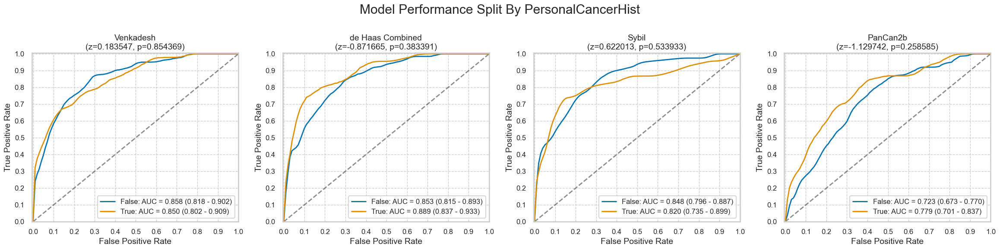

,num,pct,num_mal,pct_mal
False,824,70.307167,80,9.708738
True,348,29.692833,47,13.505747


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.183547,-0.871665,0.622013,-1.129742
p,0.854369,0.383391,0.533933,0.258585


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,824,80,744,70,242,502,10,0.875000,0.325269,0.125000,0.674731,0.224359,0.980469,0.775641,0.019531,0.694175,0.549731,0.357143,0.335560
True,348,47,301,37,94,207,10,0.787234,0.312292,0.212766,0.687708,0.282443,0.953917,0.717557,0.046083,0.701149,0.474942,0.415730,0.335048


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,824,80,744,71,289,455,9,0.88750,0.388441,0.11250,0.611559,0.197222,0.980603,0.802778,0.019397,0.638350,0.499059,0.322727,0.297902
True,348,47,301,44,118,183,3,0.93617,0.392027,0.06383,0.607973,0.271605,0.983871,0.728395,0.016129,0.652299,0.544144,0.421053,0.372848


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,824,80,744,41,64,680,39,0.512500,0.086022,0.487500,0.913978,0.390476,0.945758,0.609524,0.054242,0.875000,0.426478,0.443243,0.378678
True,348,47,301,30,32,269,17,0.638298,0.106312,0.361702,0.893688,0.483871,0.940559,0.516129,0.059441,0.859195,0.531986,0.550459,0.475175


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,824,80,744,43,194,550,37,0.537500,0.260753,0.462500,0.739247,0.181435,0.936968,0.818565,0.063032,0.719660,0.276747,0.271293,0.181018
True,348,47,301,37,107,194,10,0.787234,0.355482,0.212766,0.644518,0.256944,0.950980,0.743056,0.049020,0.663793,0.431752,0.387435,0.299620


#### Emphysema

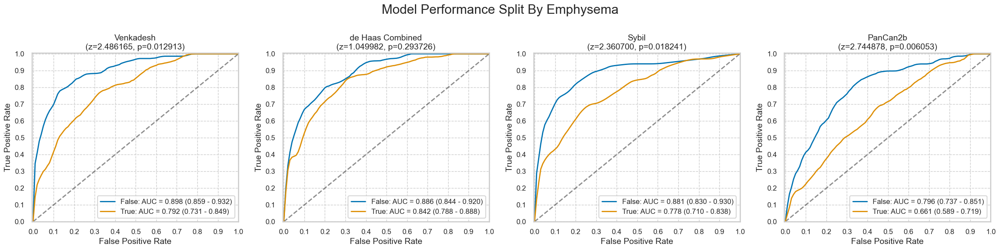

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,2.486165,1.049982,2.360700,2.744878
p,0.012913,0.293726,0.018241,0.006053


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,733,70,663,62,200,463,8,0.885714,0.301659,0.114286,0.698341,0.236641,0.983015,0.763359,0.016985,0.716235,0.584055,0.373494,0.358178
True,439,57,382,45,136,246,12,0.789474,0.356021,0.210526,0.643979,0.248619,0.953488,0.751381,0.046512,0.662870,0.433453,0.378151,0.295980


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,733,70,663,65,252,411,5,0.928571,0.380090,0.071429,0.619910,0.205047,0.987981,0.794953,0.012019,0.649386,0.548481,0.335917,0.325380
True,439,57,382,50,155,227,7,0.877193,0.405759,0.122807,0.594241,0.243902,0.970085,0.756098,0.029915,0.630979,0.471434,0.381679,0.317618


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,733,70,663,45,52,611,25,0.642857,0.078431,0.357143,0.921569,0.463918,0.960692,0.536082,0.039308,0.894952,0.564426,0.538922,0.489551
True,439,57,382,26,44,338,31,0.456140,0.115183,0.543860,0.884817,0.371429,0.915989,0.628571,0.084011,0.829157,0.340957,0.409449,0.313045


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,733,70,663,49,167,496,21,0.70000,0.251885,0.30000,0.748115,0.226852,0.959381,0.773148,0.040619,0.743520,0.448115,0.342657,0.288884
True,439,57,382,31,134,248,26,0.54386,0.350785,0.45614,0.649215,0.187879,0.905109,0.812121,0.094891,0.635535,0.193074,0.279279,0.133991


In [9]:
for c in nlst_democols['cat']['other']:
    plot_by_category(nlst_preds, c)

### Demographics

#### marital

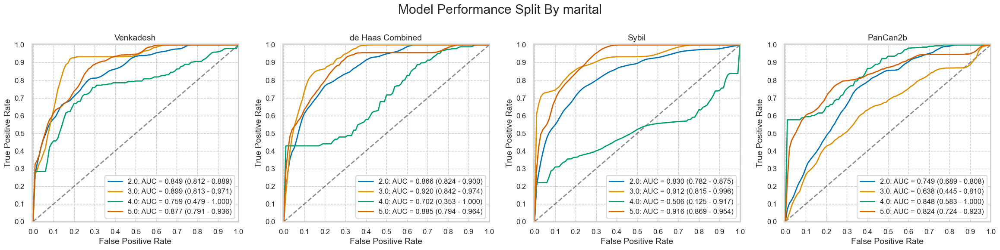

,num,pct,num_mal,pct_mal
1.0,46,3.924915,0,0.000000
2.0,785,66.979522,86,10.955414
3.0,120,10.238908,14,11.666667
4.0,19,1.621160,5,26.315789
5.0,202,17.235495,22,10.891089


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
2.0,785,86,699,70,216,483,16,0.813953,0.309013,0.186047,0.690987,0.244755,0.967936,0.755245,0.032064,0.704459,0.504941,0.376344,0.327714
3.0,120,14,106,13,37,69,1,0.928571,0.349057,0.071429,0.650943,0.260000,0.985714,0.740000,0.014286,0.683333,0.579515,0.406250,0.377353
4.0,19,5,14,4,4,10,1,0.800000,0.285714,0.200000,0.714286,0.500000,0.909091,0.500000,0.090909,0.736842,0.514286,0.615385,0.458682
5.0,202,22,180,20,60,120,2,0.909091,0.333333,0.090909,0.666667,0.250000,0.983607,0.750000,0.016393,0.693069,0.575758,0.392157,0.366743


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
2.0,785,86,699,76,256,443,10,0.883721,0.366237,0.116279,0.633763,0.228916,0.977925,0.771084,0.022075,0.661146,0.517483,0.363636,0.327164
3.0,120,14,106,14,52,54,0,1.000000,0.490566,0.000000,0.509434,0.212121,1.000000,0.787879,0.000000,0.566667,0.509434,0.350000,0.328727
4.0,19,5,14,4,6,8,1,0.800000,0.428571,0.200000,0.571429,0.400000,0.888889,0.600000,0.111111,0.631579,0.371429,0.533333,0.327569
5.0,202,22,180,21,74,106,1,0.954545,0.411111,0.045455,0.588889,0.221053,0.990654,0.778947,0.009346,0.628713,0.543434,0.358974,0.339188


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
2.0,785,86,699,47,70,629,39,0.546512,0.100143,0.453488,0.899857,0.401709,0.941617,0.598291,0.058383,0.861146,0.446369,0.463054,0.391472
3.0,120,14,106,10,9,97,4,0.714286,0.084906,0.285714,0.915094,0.526316,0.960396,0.473684,0.039604,0.891667,0.629380,0.606061,0.553468
4.0,19,5,14,1,0,14,4,0.200000,0.000000,0.800000,1.000000,1.000000,0.777778,0.000000,0.222222,0.789474,0.200000,0.333333,0.394405
5.0,202,22,180,13,14,166,9,0.590909,0.077778,0.409091,0.922222,0.481481,0.948571,0.518519,0.051429,0.886139,0.513131,0.530612,0.469759


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
2.0,785,86,699,51,181,518,35,0.593023,0.258941,0.406977,0.741059,0.219828,0.936709,0.780172,0.063291,0.724841,0.334082,0.320755,0.228683
3.0,120,14,106,8,37,69,6,0.571429,0.349057,0.428571,0.650943,0.177778,0.920000,0.822222,0.080000,0.641667,0.222372,0.271186,0.147455
4.0,19,5,14,3,4,10,2,0.600000,0.285714,0.400000,0.714286,0.428571,0.833333,0.571429,0.166667,0.684211,0.314286,0.500000,0.286902
5.0,202,22,180,18,55,125,4,0.818182,0.305556,0.181818,0.694444,0.246575,0.968992,0.753425,0.031008,0.707921,0.512626,0.378947,0.332424


#### educat

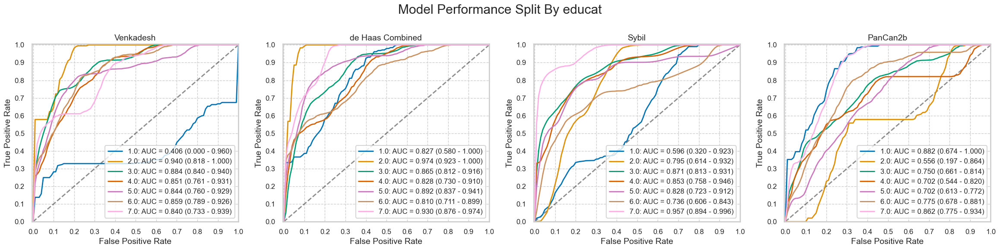

,num,pct,num_mal,pct_mal
1.0,27,2.341717,4,14.814815
2.0,67,5.810928,2,2.985075
3.0,307,26.626193,36,11.726384
4.0,144,12.489159,16,11.111111
5.0,244,21.162186,31,12.704918
6.0,185,16.045100,21,11.351351
7.0,179,15.524718,16,8.938547


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1.0,27,4,23,2,7,16,2,0.500000,0.304348,0.500000,0.695652,0.222222,0.888889,0.777778,0.111111,0.666667,0.195652,0.307692,0.147442
2.0,67,2,65,2,21,44,0,1.000000,0.323077,0.000000,0.676923,0.086957,1.000000,0.913043,0.000000,0.686567,0.676923,0.160000,0.242617
3.0,307,36,271,33,95,176,3,0.916667,0.350554,0.083333,0.649446,0.257812,0.983240,0.742188,0.016760,0.680782,0.566113,0.402439,0.369409
4.0,144,16,128,15,54,74,1,0.937500,0.421875,0.062500,0.578125,0.217391,0.986667,0.782609,0.013333,0.618056,0.515625,0.352941,0.324372
5.0,244,31,213,26,62,151,5,0.838710,0.291080,0.161290,0.708920,0.295455,0.967949,0.704545,0.032051,0.725410,0.547630,0.436975,0.379799
6.0,185,21,164,18,41,123,3,0.857143,0.250000,0.142857,0.750000,0.305085,0.976190,0.694915,0.023810,0.762162,0.607143,0.450000,0.413248
7.0,179,16,163,10,48,115,6,0.625000,0.294479,0.375000,0.705521,0.172414,0.950413,0.827586,0.049587,0.698324,0.330521,0.270270,0.201487


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1.0,27,4,23,4,13,10,0,1.000000,0.565217,0.000000,0.434783,0.235294,1.000000,0.764706,0.000000,0.518519,0.434783,0.380952,0.319847
2.0,67,2,65,2,28,37,0,1.000000,0.430769,0.000000,0.569231,0.066667,1.000000,0.933333,0.000000,0.582090,0.569231,0.125000,0.194804
3.0,307,36,271,34,109,162,2,0.944444,0.402214,0.055556,0.597786,0.237762,0.987805,0.762238,0.012195,0.638436,0.542230,0.379888,0.349728
4.0,144,16,128,14,50,78,2,0.875000,0.390625,0.125000,0.609375,0.218750,0.975000,0.781250,0.025000,0.638889,0.484375,0.350000,0.306346
5.0,244,31,213,28,70,143,3,0.903226,0.328638,0.096774,0.671362,0.285714,0.979452,0.714286,0.020548,0.700820,0.574587,0.434109,0.390335
6.0,185,21,164,16,60,104,5,0.761905,0.365854,0.238095,0.634146,0.210526,0.954128,0.789474,0.045872,0.648649,0.396051,0.329897,0.255366
7.0,179,16,163,16,67,96,0,1.000000,0.411043,0.000000,0.588957,0.192771,1.000000,0.807229,0.000000,0.625698,0.588957,0.323232,0.336948


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1.0,27,4,23,1,2,21,3,0.250000,0.086957,0.750000,0.913043,0.333333,0.875000,0.666667,0.125000,0.814815,0.163043,0.285714,0.184302
2.0,67,2,65,0,5,60,2,0.000000,0.076923,1.000000,0.923077,0.000000,0.967742,1.000000,0.032258,0.895522,-0.076923,0.000000,-0.049814
3.0,307,36,271,23,32,239,13,0.638889,0.118081,0.361111,0.881919,0.418182,0.948413,0.581818,0.051587,0.853420,0.520808,0.505495,0.436950
4.0,144,16,128,8,10,118,8,0.500000,0.078125,0.500000,0.921875,0.444444,0.936508,0.555556,0.063492,0.875000,0.421875,0.470588,0.400892
5.0,244,31,213,17,23,190,14,0.548387,0.107981,0.451613,0.892019,0.425000,0.931373,0.575000,0.068627,0.848361,0.440406,0.478873,0.396167
6.0,185,21,164,9,11,153,12,0.428571,0.067073,0.571429,0.932927,0.450000,0.927273,0.550000,0.072727,0.875676,0.361498,0.439024,0.369301
7.0,179,16,163,13,10,153,3,0.812500,0.061350,0.187500,0.938650,0.565217,0.980769,0.434783,0.019231,0.927374,0.751150,0.666667,0.640405


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1.0,27,4,23,4,8,15,0,1.000000,0.347826,0.000000,0.652174,0.333333,1.000000,0.666667,0.000000,0.703704,0.652174,0.500000,0.466252
2.0,67,2,65,1,24,41,1,0.500000,0.369231,0.500000,0.630769,0.040000,0.976190,0.960000,0.023810,0.626866,0.130769,0.074074,0.046013
3.0,307,36,271,23,84,187,13,0.638889,0.309963,0.361111,0.690037,0.214953,0.935000,0.785047,0.065000,0.684039,0.328926,0.321678,0.222089
4.0,144,16,128,9,37,91,7,0.562500,0.289062,0.437500,0.710938,0.195652,0.928571,0.804348,0.071429,0.694444,0.273438,0.290323,0.184302
5.0,244,31,213,15,61,152,16,0.483871,0.286385,0.516129,0.713615,0.197368,0.904762,0.802632,0.095238,0.684426,0.197486,0.280374,0.142019
6.0,185,21,164,12,36,128,9,0.571429,0.219512,0.428571,0.780488,0.250000,0.934307,0.750000,0.065693,0.756757,0.351916,0.347826,0.254677
7.0,179,16,163,15,43,120,1,0.937500,0.263804,0.062500,0.736196,0.258621,0.991736,0.741379,0.008264,0.754190,0.673696,0.405405,0.410687


#### race

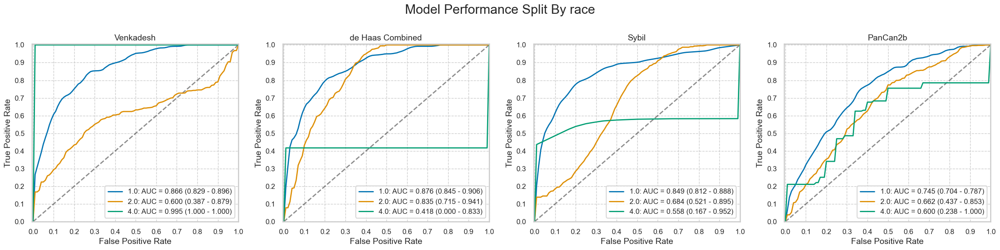

,num,pct,num_mal,pct_mal
1.0,1098,93.926433,112,10.200364
2.0,40,3.421728,9,22.500000
3.0,7,0.598802,0,0.000000
4.0,10,0.855432,5,50.000000
5.0,3,0.256630,1,33.333333
6.0,11,0.940975,0,0.000000


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1.0,1098,112,986,95,309,677,17,0.848214,0.313387,0.151786,0.686613,0.235149,0.975504,0.764851,0.024496,0.703097,0.534827,0.368217,0.335653
2.0,40,9,31,6,11,20,3,0.666667,0.354839,0.333333,0.645161,0.352941,0.869565,0.647059,0.130435,0.650000,0.311828,0.461538,0.263408
4.0,10,5,5,5,5,0,0,1.000000,1.000000,0.000000,0.000000,0.500000,NaN,0.500000,NaN,0.500000,0.000000,0.666667,NaN


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1.0,1098,112,986,101,378,608,11,0.901786,0.383367,0.098214,0.616633,0.210856,0.982229,0.789144,0.017771,0.645719,0.518419,0.341794,0.316384
2.0,40,9,31,9,14,17,0,1.000000,0.451613,0.000000,0.548387,0.391304,1.000000,0.608696,0.000000,0.650000,0.548387,0.562500,0.463235
4.0,10,5,5,4,5,0,1,0.800000,1.000000,0.200000,0.000000,0.444444,0.000000,0.555556,1.000000,0.400000,-0.200000,0.571429,-0.333333


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1.0,1098,112,986,65,86,900,47,0.580357,0.087221,0.419643,0.912779,0.430464,0.950370,0.569536,0.049630,0.878871,0.493136,0.494297,0.433362
2.0,40,9,31,2,4,27,7,0.222222,0.129032,0.777778,0.870968,0.333333,0.794118,0.666667,0.205882,0.725000,0.093190,0.266667,0.108982
4.0,10,5,5,3,5,0,2,0.600000,1.000000,0.400000,0.000000,0.375000,0.000000,0.625000,1.000000,0.300000,-0.400000,0.461538,-0.500000


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1.0,1098,112,986,67,273,713,45,0.598214,0.276876,0.401786,0.723124,0.197059,0.940633,0.802941,0.059367,0.710383,0.321338,0.296460,0.210347
2.0,40,9,31,8,16,15,1,0.888889,0.516129,0.111111,0.483871,0.333333,0.937500,0.666667,0.062500,0.575000,0.372760,0.484848,0.317735
4.0,10,5,5,4,2,3,1,0.800000,0.400000,0.200000,0.600000,0.666667,0.750000,0.333333,0.250000,0.700000,0.400000,0.727273,0.408248


#### ethnic

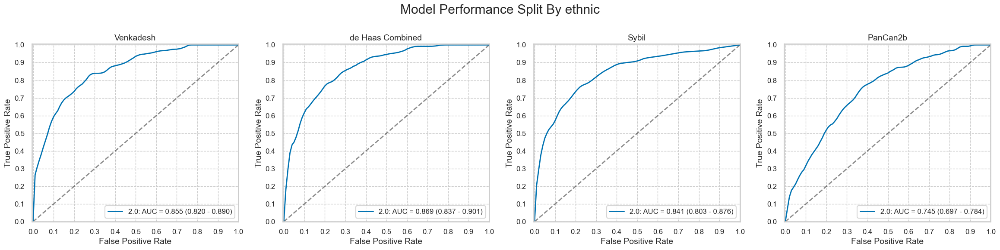

,num,pct,num_mal,pct_mal
1.0,11,0.940171,1,9.090909
2.0,1159,99.059829,126,10.871441


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
2.0,1159,126,1033,106,330,703,20,0.84127,0.319458,0.15873,0.680542,0.243119,0.972337,0.756881,0.027663,0.698016,0.521812,0.377224,0.335303


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
2.0,1159,126,1033,114,400,633,12,0.904762,0.387222,0.095238,0.612778,0.22179,0.981395,0.77821,0.018605,0.644521,0.51754,0.35625,0.324278


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
2.0,1159,126,1033,70,96,937,56,0.555556,0.092933,0.444444,0.907067,0.421687,0.943605,0.578313,0.056395,0.868852,0.462622,0.479452,0.411087


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
2.0,1159,126,1033,79,294,739,47,0.626984,0.284608,0.373016,0.715392,0.211796,0.940204,0.788204,0.059796,0.705781,0.342376,0.316633,0.228125


#### Gender

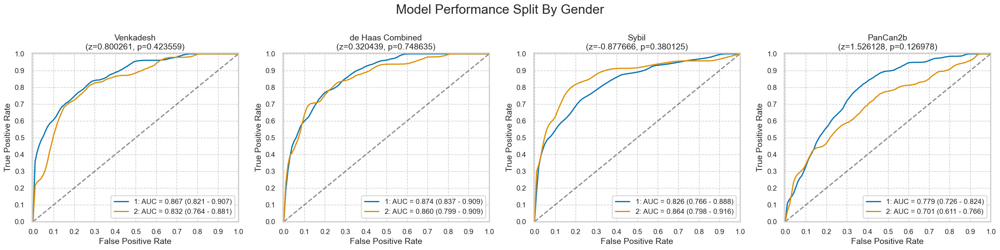

,num,pct,num_mal,pct_mal
1,693,59.129693,79,11.399711
2,479,40.870307,48,10.020877


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.800261,0.320439,-0.877666,1.526128
p,0.423559,0.748635,0.380125,0.126978


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1,693,79,614,67,199,415,12,0.848101,0.324104,0.151899,0.675896,0.251880,0.971897,0.748120,0.028103,0.695527,0.523997,0.388406,0.342430
2,479,48,431,40,137,294,8,0.833333,0.317865,0.166667,0.682135,0.225989,0.973510,0.774011,0.026490,0.697286,0.515468,0.355556,0.320679


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1,693,79,614,72,223,391,7,0.911392,0.363192,0.088608,0.636808,0.244068,0.982412,0.755932,0.017588,0.668110,0.548200,0.385027,0.352358
2,479,48,431,43,184,247,5,0.895833,0.426914,0.104167,0.573086,0.189427,0.980159,0.810573,0.019841,0.605428,0.468919,0.312727,0.281997


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1,693,79,614,41,51,563,38,0.518987,0.083062,0.481013,0.916938,0.445652,0.936772,0.554348,0.063228,0.871573,0.435925,0.479532,0.408299
2,479,48,431,30,45,386,18,0.625000,0.104408,0.375000,0.895592,0.400000,0.955446,0.600000,0.044554,0.868476,0.520592,0.487805,0.430165


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
1,693,79,614,49,145,469,30,0.620253,0.236156,0.379747,0.763844,0.252577,0.939880,0.747423,0.060120,0.747475,0.384097,0.358974,0.271886
2,479,48,431,31,156,275,17,0.645833,0.361949,0.354167,0.638051,0.165775,0.941781,0.834225,0.058219,0.638831,0.283884,0.263830,0.174738


#### Married

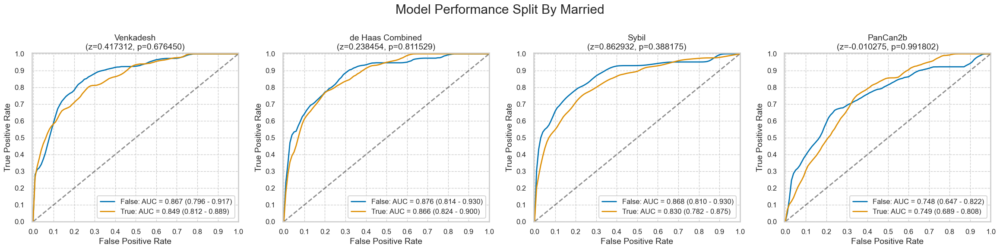

,num,pct,num_mal,pct_mal
False,387,33.020478,41,10.594315
True,785,66.979522,86,10.955414


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.417312,0.238454,0.862932,-0.010275
p,0.676450,0.811529,0.388175,0.991802


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,387,41,346,37,120,226,4,0.902439,0.346821,0.097561,0.653179,0.235669,0.982609,0.764331,0.017391,0.679587,0.555618,0.373737,0.348251
True,785,86,699,70,216,483,16,0.813953,0.309013,0.186047,0.690987,0.244755,0.967936,0.755245,0.032064,0.704459,0.504941,0.376344,0.327714


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,387,41,346,39,151,195,2,0.951220,0.436416,0.048780,0.563584,0.205263,0.989848,0.794737,0.010152,0.604651,0.514803,0.337662,0.316929
True,785,86,699,76,256,443,10,0.883721,0.366237,0.116279,0.633763,0.228916,0.977925,0.771084,0.022075,0.661146,0.517483,0.363636,0.327164


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,387,41,346,24,26,320,17,0.585366,0.075145,0.414634,0.924855,0.480000,0.949555,0.520000,0.050445,0.888889,0.510221,0.527473,0.468154
True,785,86,699,47,70,629,39,0.546512,0.100143,0.453488,0.899857,0.401709,0.941617,0.598291,0.058383,0.861146,0.446369,0.463054,0.391472


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,387,41,346,29,120,226,12,0.707317,0.346821,0.292683,0.653179,0.194631,0.949580,0.805369,0.050420,0.658915,0.360496,0.305263,0.228008
True,785,86,699,51,181,518,35,0.593023,0.258941,0.406977,0.741059,0.219828,0.936709,0.780172,0.063291,0.724841,0.334082,0.320755,0.228683


#### NonHispanicWhite

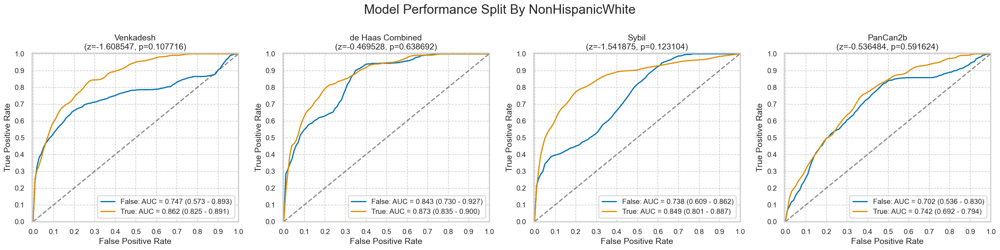

,num,pct,num_mal,pct_mal
False,83,7.081911,16,19.277108
True,1089,92.918089,111,10.192837


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-1.608547,-0.469528,-1.541875,-0.536484
p,0.107716,0.638692,0.123104,0.591624


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,83,16,67,13,32,35,3,0.812500,0.477612,0.187500,0.522388,0.288889,0.921053,0.711111,0.078947,0.578313,0.334888,0.426230,0.265154
True,1089,111,978,94,304,674,17,0.846847,0.310838,0.153153,0.689162,0.236181,0.975398,0.763819,0.024602,0.705234,0.536008,0.369352,0.336761


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,83,16,67,15,33,34,1,0.937500,0.492537,0.062500,0.507463,0.31250,0.971429,0.68750,0.028571,0.590361,0.444963,0.46875,0.355440
True,1089,111,978,100,374,604,11,0.900901,0.382413,0.099099,0.617587,0.21097,0.982114,0.78903,0.017886,0.646465,0.518488,0.34188,0.316405


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,83,16,67,7,10,57,9,0.437500,0.149254,0.562500,0.850746,0.411765,0.863636,0.588235,0.136364,0.771084,0.288246,0.424242,0.281750
True,1089,111,978,64,86,892,47,0.576577,0.087935,0.423423,0.912065,0.426667,0.949947,0.573333,0.050053,0.877870,0.488642,0.490421,0.428986


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,83,16,67,14,33,34,2,0.875000,0.492537,0.125000,0.507463,0.297872,0.944444,0.702128,0.055556,0.578313,0.382463,0.444444,0.304429
True,1089,111,978,66,268,710,45,0.594595,0.274029,0.405405,0.725971,0.197605,0.940397,0.802395,0.059603,0.712580,0.320566,0.296629,0.210330


#### HighSchoolPlus

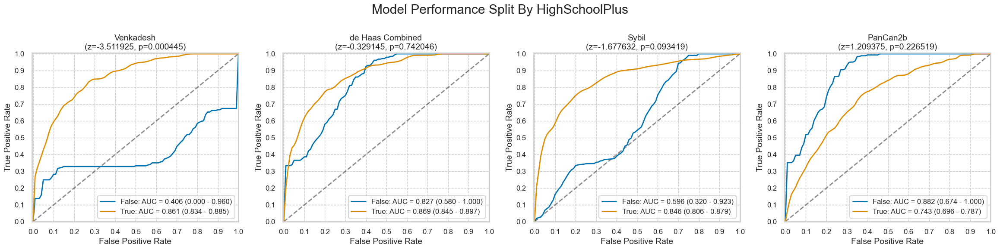

,num,pct,num_mal,pct_mal
False,27,2.303754,4,14.814815
True,1145,97.696246,123,10.742358


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-3.511925,-0.329145,-1.677632,1.209375
p,0.000445,0.742046,0.093419,0.226519


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,27,4,23,2,7,16,2,0.500000,0.304348,0.500000,0.695652,0.222222,0.888889,0.777778,0.111111,0.666667,0.195652,0.307692,0.147442
True,1145,123,1022,105,329,693,18,0.853659,0.321918,0.146341,0.678082,0.241935,0.974684,0.758065,0.025316,0.696943,0.531741,0.377020,0.339389


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,27,4,23,4,13,10,0,1.000000,0.565217,0.000000,0.434783,0.235294,1.00000,0.764706,0.00000,0.518519,0.434783,0.380952,0.319847
True,1145,123,1022,111,394,628,12,0.902439,0.385519,0.097561,0.614481,0.219802,0.98125,0.780198,0.01875,0.645415,0.516920,0.353503,0.322378


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,27,4,23,1,2,21,3,0.250000,0.086957,0.750000,0.913043,0.333333,0.875000,0.666667,0.125000,0.814815,0.163043,0.285714,0.184302
True,1145,123,1022,70,94,928,53,0.569106,0.091977,0.430894,0.908023,0.426829,0.945973,0.573171,0.054027,0.871616,0.477129,0.487805,0.421752


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,27,4,23,4,8,15,0,1.000000,0.347826,0.000000,0.652174,0.333333,1.000000,0.666667,0.000000,0.703704,0.652174,0.500000,0.466252
True,1145,123,1022,76,293,729,47,0.617886,0.286693,0.382114,0.713307,0.205962,0.939433,0.794038,0.060567,0.703057,0.331193,0.308943,0.219440


In [10]:
for cat in nlst_democols['cat']['demo']:
    plot_by_category(nlst_preds, cat)

### Smoking

#### cigar

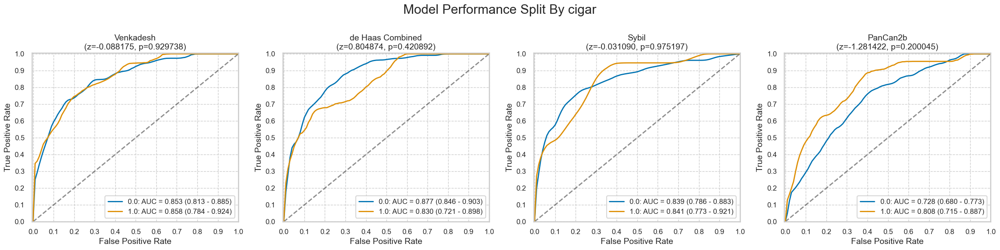

,num,pct,num_mal,pct_mal
0.0,931,79.845626,105,11.278195
1.0,235,20.154374,21,8.936170


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.088175,0.804874,-0.031090,-1.281422
p,0.929738,0.420892,0.975197,0.200045


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,931,105,826,89,277,549,16,0.847619,0.335351,0.152381,0.664649,0.243169,0.971681,0.756831,0.028319,0.685285,0.512268,0.377919,0.331755
1.0,235,21,214,17,59,155,4,0.809524,0.275701,0.190476,0.724299,0.223684,0.974843,0.776316,0.025157,0.731915,0.533823,0.350515,0.325543


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,931,105,826,98,328,498,7,0.933333,0.397094,0.066667,0.602906,0.230047,0.986139,0.769953,0.013861,0.640172,0.536239,0.369115,0.340481
1.0,235,21,214,16,79,135,5,0.761905,0.369159,0.238095,0.630841,0.168421,0.964286,0.831579,0.035714,0.642553,0.392746,0.275862,0.228298


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,931,105,826,60,85,741,45,0.571429,0.102906,0.428571,0.897094,0.413793,0.942748,0.586207,0.057252,0.860365,0.468523,0.48000,0.408715
1.0,235,21,214,10,11,203,11,0.476190,0.051402,0.523810,0.948598,0.476190,0.948598,0.523810,0.051402,0.906383,0.424789,0.47619,0.424789


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,931,105,826,67,265,561,38,0.638095,0.320823,0.361905,0.679177,0.201807,0.936561,0.798193,0.063439,0.674544,0.317272,0.306636,0.209524
1.0,235,21,214,13,36,178,8,0.619048,0.168224,0.380952,0.831776,0.265306,0.956989,0.734694,0.043011,0.812766,0.450823,0.371429,0.316569


#### cigsmok

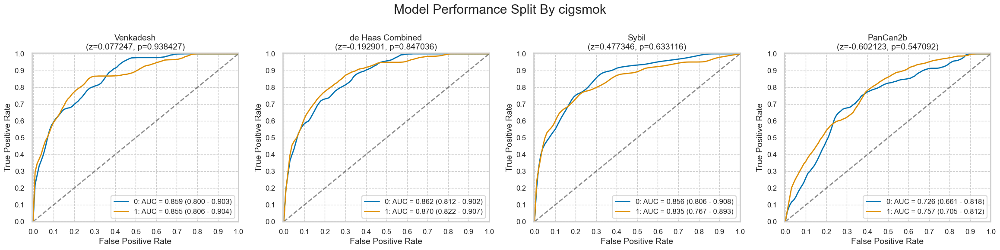

,num,pct,num_mal,pct_mal
0,560,47.78157,46,8.214286
1,612,52.21843,81,13.235294


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.077247,-0.192901,0.477346,-0.602123
p,0.938427,0.847036,0.633116,0.547092


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0,560,46,514,37,167,347,9,0.804348,0.324903,0.195652,0.675097,0.181373,0.974719,0.818627,0.025281,0.685714,0.479445,0.2960,0.273564
1,612,81,531,70,169,362,11,0.864198,0.318267,0.135802,0.681733,0.292887,0.970509,0.707113,0.029491,0.705882,0.545930,0.4375,0.379204


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0,560,46,514,41,188,326,5,0.891304,0.365759,0.108696,0.634241,0.179039,0.984894,0.820961,0.015106,0.655357,0.525546,0.298182,0.293521
1,612,81,531,74,219,312,7,0.913580,0.412429,0.086420,0.587571,0.252560,0.978056,0.747440,0.021944,0.630719,0.501151,0.395722,0.339961


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0,560,46,514,25,45,469,21,0.543478,0.087549,0.456522,0.912451,0.357143,0.957143,0.642857,0.042857,0.882143,0.455930,0.431034,0.378540
1,612,81,531,46,51,480,35,0.567901,0.096045,0.432099,0.903955,0.474227,0.932039,0.525773,0.067961,0.859477,0.471856,0.516854,0.437834


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0,560,46,514,29,130,384,17,0.630435,0.252918,0.369565,0.747082,0.18239,0.957606,0.81761,0.042394,0.737500,0.377516,0.282927,0.229893
1,612,81,531,51,171,360,30,0.629630,0.322034,0.370370,0.677966,0.22973,0.923077,0.77027,0.076923,0.671569,0.307596,0.336634,0.216801


#### pipe

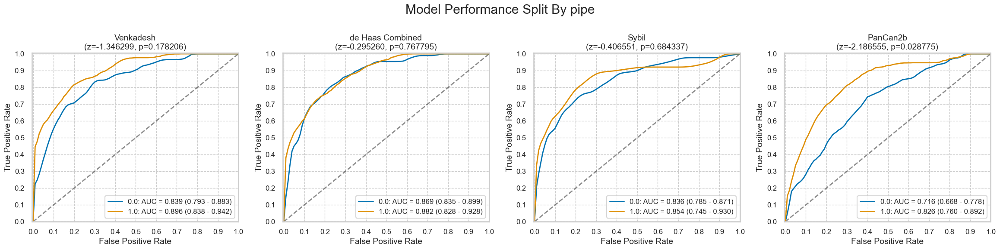

,num,pct,num_mal,pct_mal
0.0,882,75.708155,87,9.863946
1.0,283,24.291845,39,13.780919


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-1.346299,-0.295260,-0.406551,-2.186555
p,0.178206,0.767795,0.684337,0.028775


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,882,87,795,73,267,528,14,0.839080,0.335849,0.160920,0.664151,0.214706,0.974170,0.785294,0.025830,0.681406,0.503231,0.341920,0.308299
1.0,283,39,244,33,69,175,6,0.846154,0.282787,0.153846,0.717213,0.323529,0.966851,0.676471,0.033149,0.734982,0.563367,0.468085,0.404463


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,882,87,795,80,326,469,7,0.919540,0.410063,0.080460,0.589937,0.197044,0.985294,0.802956,0.014706,0.622449,0.509477,0.324544,0.304791
1.0,283,39,244,34,80,164,5,0.871795,0.327869,0.128205,0.672131,0.298246,0.970414,0.701754,0.029586,0.699647,0.543926,0.444444,0.382271


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,882,87,795,49,83,712,38,0.563218,0.104403,0.436782,0.895597,0.371212,0.949333,0.628788,0.050667,0.862812,0.458816,0.447489,0.383499
1.0,283,39,244,21,13,231,18,0.538462,0.053279,0.461538,0.946721,0.617647,0.927711,0.382353,0.072289,0.890459,0.485183,0.575342,0.514391


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,882,87,795,53,250,545,34,0.609195,0.314465,0.390805,0.685535,0.174917,0.941278,0.825083,0.058722,0.678005,0.294730,0.271795,0.185058
1.0,283,39,244,27,51,193,12,0.692308,0.209016,0.307692,0.790984,0.346154,0.941463,0.653846,0.058537,0.777385,0.483291,0.461538,0.372831


#### smokelive

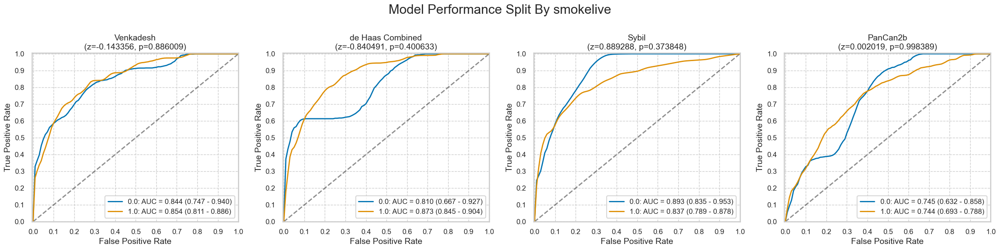

,num,pct,num_mal,pct_mal
0.0,139,11.910883,13,9.352518
1.0,1028,88.089117,113,10.992218


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.143356,-0.840491,0.889288,0.002019
p,0.886009,0.400633,0.373848,0.998389


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,139,13,126,11,42,84,2,0.846154,0.333333,0.153846,0.666667,0.207547,0.976744,0.792453,0.023256,0.683453,0.512821,0.333333,0.307422
1.0,1028,113,915,95,294,621,18,0.840708,0.321311,0.159292,0.678689,0.244216,0.971831,0.755784,0.028169,0.696498,0.519396,0.378486,0.334984


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,139,13,126,9,51,75,4,0.692308,0.404762,0.307692,0.595238,0.150000,0.949367,0.850000,0.050633,0.604317,0.287546,0.246575,0.169034
1.0,1028,113,915,105,356,559,8,0.929204,0.389071,0.070796,0.610929,0.227766,0.985891,0.772234,0.014109,0.645914,0.540133,0.365854,0.339710


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,139,13,126,7,12,114,6,0.538462,0.095238,0.461538,0.904762,0.368421,0.950000,0.631579,0.050000,0.870504,0.443223,0.437500,0.375675
1.0,1028,113,915,63,84,831,50,0.557522,0.091803,0.442478,0.908197,0.428571,0.943246,0.571429,0.056754,0.869650,0.465719,0.484615,0.416128


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,139,13,126,7,40,86,6,0.538462,0.317460,0.461538,0.682540,0.148936,0.934783,0.851064,0.065217,0.669065,0.221001,0.233333,0.136022
1.0,1028,113,915,72,261,654,41,0.637168,0.285246,0.362832,0.714754,0.216216,0.941007,0.783784,0.058993,0.706226,0.351922,0.322870,0.235224


#### smokework

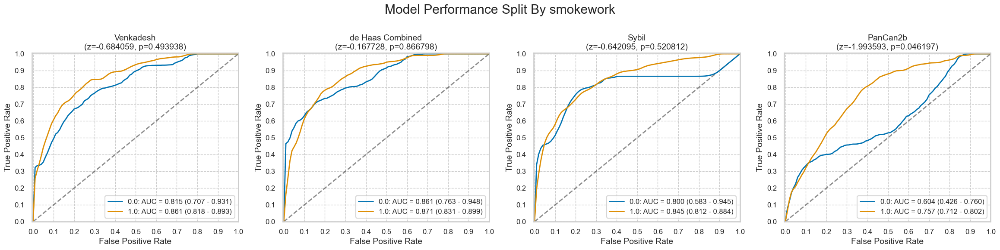

,num,pct,num_mal,pct_mal
0.0,150,12.931034,16,10.666667
1.0,1010,87.068966,111,10.990099


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.684059,-0.167728,-0.642095,-1.993593
p,0.493938,0.866798,0.520812,0.046197


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,150,16,134,13,50,84,3,0.812500,0.373134,0.187500,0.626866,0.206349,0.965517,0.793651,0.034483,0.646667,0.439366,0.329114,0.274795
1.0,1010,111,899,94,283,616,17,0.846847,0.314794,0.153153,0.685206,0.249337,0.973144,0.750663,0.026856,0.702970,0.532053,0.385246,0.344051


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,150,16,134,13,58,76,3,0.812500,0.432836,0.187500,0.567164,0.183099,0.962025,0.816901,0.037975,0.593333,0.379664,0.298851,0.234730
1.0,1010,111,899,102,346,553,9,0.918919,0.384872,0.081081,0.615128,0.227679,0.983986,0.772321,0.016014,0.648515,0.534047,0.364937,0.336212


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,150,16,134,7,9,125,9,0.437500,0.067164,0.562500,0.932836,0.437500,0.932836,0.562500,0.067164,0.880000,0.370336,0.43750,0.370336
1.0,1010,111,899,64,87,812,47,0.576577,0.096774,0.423423,0.903226,0.423841,0.945285,0.576159,0.054715,0.867327,0.479802,0.48855,0.420842


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,150,16,134,8,42,92,8,0.500000,0.313433,0.500000,0.686567,0.160000,0.920000,0.840000,0.080000,0.666667,0.186567,0.242424,0.122169
1.0,1010,111,899,72,256,643,39,0.648649,0.284761,0.351351,0.715239,0.219512,0.942815,0.780488,0.057185,0.707921,0.363888,0.328018,0.243041


In [11]:
for cat in nlst_democols['cat']['smoke']:
    plot_by_category(nlst_preds, cat)

### Work history

#### wrkasbe

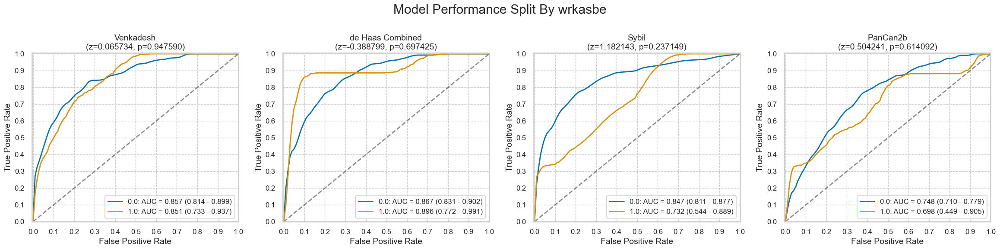

,num,pct,num_mal,pct_mal
0.0,1082,92.320819,118,10.90573
1.0,90,7.679181,9,10.00000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.065734,-0.388799,1.182143,0.504241
p,0.947590,0.697425,0.237149,0.614092


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1082,118,964,99,301,663,19,0.838983,0.312241,0.161017,0.687759,0.247500,0.972141,0.752500,0.027859,0.704251,0.526742,0.382239,0.340138
1.0,90,9,81,8,35,46,1,0.888889,0.432099,0.111111,0.567901,0.186047,0.978723,0.813953,0.021277,0.600000,0.456790,0.307692,0.274345


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1082,118,964,107,373,591,11,0.906780,0.386929,0.093220,0.613071,0.222917,0.981728,0.777083,0.018272,0.645102,0.519850,0.357860,0.326166
1.0,90,9,81,8,34,47,1,0.888889,0.419753,0.111111,0.580247,0.190476,0.979167,0.809524,0.020833,0.611111,0.469136,0.313725,0.282109


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1082,118,964,68,84,880,50,0.576271,0.087137,0.423729,0.912863,0.447368,0.946237,0.552632,0.053763,0.876155,0.489134,0.503704,0.438777
1.0,90,9,81,3,12,69,6,0.333333,0.148148,0.666667,0.851852,0.200000,0.920000,0.800000,0.080000,0.800000,0.185185,0.250000,0.149071


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1082,118,964,75,269,695,43,0.635593,0.279046,0.364407,0.720954,0.218023,0.941734,0.781977,0.058266,0.711645,0.356548,0.324675,0.238665
1.0,90,9,81,5,32,49,4,0.555556,0.395062,0.444444,0.604938,0.135135,0.924528,0.864865,0.075472,0.600000,0.160494,0.217391,0.097855


#### wrkbaki

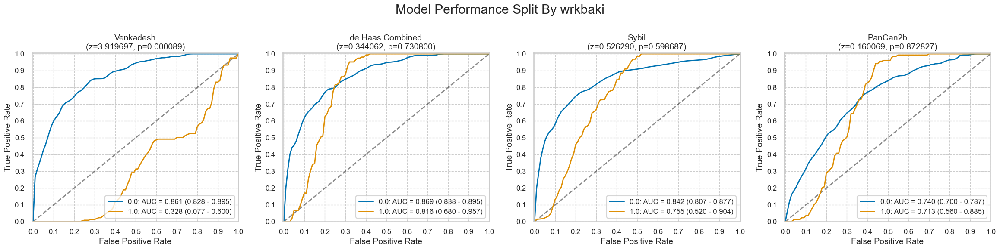

,num,pct,num_mal,pct_mal
0.0,1145,97.696246,124,10.829694
1.0,27,2.303754,3,11.111111


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,3.919697,0.344062,0.526290,0.160069
p,0.000089,0.730800,0.598687,0.872827


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1145,124,1021,106,331,690,18,0.854839,0.324192,0.145161,0.675808,0.242563,0.974576,0.757437,0.025424,0.695197,0.530647,0.377897,0.339447
1.0,27,3,24,1,5,19,2,0.333333,0.208333,0.666667,0.791667,0.166667,0.904762,0.833333,0.095238,0.740741,0.125000,0.222222,0.094491


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1145,124,1021,112,396,625,12,0.903226,0.387855,0.096774,0.612145,0.220472,0.981162,0.779528,0.018838,0.643668,0.515371,0.354430,0.322361
1.0,27,3,24,3,11,13,0,1.000000,0.458333,0.000000,0.541667,0.214286,1.000000,0.785714,0.000000,0.592593,0.541667,0.352941,0.340693


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1145,124,1021,70,95,926,54,0.564516,0.093046,0.435484,0.906954,0.424242,0.944898,0.575758,0.055102,0.869869,0.471470,0.484429,0.417179
1.0,27,3,24,1,1,23,2,0.333333,0.041667,0.666667,0.958333,0.500000,0.920000,0.500000,0.080000,0.888889,0.291667,0.400000,0.350000


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1145,124,1021,77,292,729,47,0.620968,0.285994,0.379032,0.714006,0.208672,0.939433,0.791328,0.060567,0.703930,0.334974,0.312373,0.222736
1.0,27,3,24,3,9,15,0,1.000000,0.375000,0.000000,0.625000,0.250000,1.000000,0.750000,0.000000,0.666667,0.625000,0.400000,0.395285


#### wrkbutc

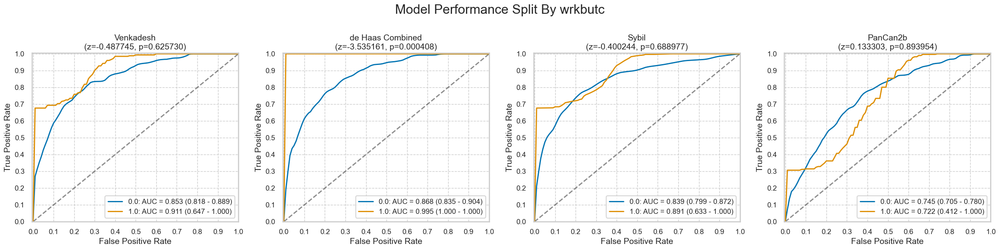

,num,pct,num_mal,pct_mal
0.0,1154,98.464164,124,10.745234
1.0,18,1.535836,3,16.666667


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.487745,-3.535161,-0.400244,0.133303
p,0.625730,0.000408,0.688977,0.893954


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1154,124,1030,104,330,700,20,0.83871,0.320388,0.16129,0.679612,0.239631,0.972222,0.760369,0.027778,0.696707,0.518321,0.37276,0.331373
1.0,18,3,15,3,6,9,0,1.00000,0.400000,0.00000,0.600000,0.333333,1.000000,0.666667,0.000000,0.666667,0.600000,0.50000,0.447214


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1154,124,1030,112,401,629,12,0.903226,0.38932,0.096774,0.61068,0.218324,0.981279,0.781676,0.018721,0.642114,0.513905,0.351648,0.320276
1.0,18,3,15,3,6,9,0,1.000000,0.40000,0.000000,0.60000,0.333333,1.000000,0.666667,0.000000,0.666667,0.600000,0.500000,0.447214


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1154,124,1030,69,96,934,55,0.556452,0.093204,0.443548,0.906796,0.418182,0.944388,0.581818,0.055612,0.869151,0.463248,0.477509,0.409829
1.0,18,3,15,2,0,15,1,0.666667,0.000000,0.333333,1.000000,1.000000,0.937500,0.000000,0.062500,0.944444,0.666667,0.800000,0.790569


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1154,124,1030,79,295,735,45,0.637097,0.286408,0.362903,0.713592,0.211230,0.942308,0.788770,0.057692,0.705373,0.350689,0.317269,0.232043
1.0,18,3,15,1,6,9,2,0.333333,0.400000,0.666667,0.600000,0.142857,0.818182,0.857143,0.181818,0.555556,-0.066667,0.200000,-0.050965


#### wrkchem

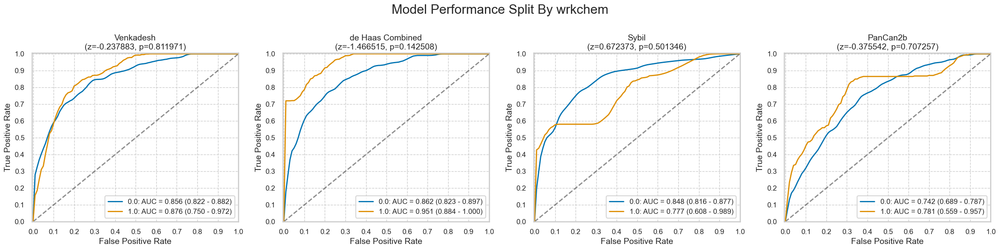

,num,pct,num_mal,pct_mal
0.0,1087,92.826644,120,11.039558
1.0,84,7.173356,7,8.333333


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.237883,-1.466515,0.672373,-0.375542
p,0.811971,0.142508,0.501346,0.707257


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1087,120,967,101,316,651,19,0.841667,0.326784,0.158333,0.673216,0.242206,0.971642,0.757794,0.028358,0.691812,0.514883,0.376164,0.331823
1.0,84,7,77,6,20,57,1,0.857143,0.259740,0.142857,0.740260,0.230769,0.982759,0.769231,0.017241,0.750000,0.597403,0.363636,0.357158


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1087,120,967,108,386,581,12,0.9,0.399173,0.1,0.600827,0.218623,0.979764,0.781377,0.020236,0.633855,0.500827,0.351792,0.315211
1.0,84,7,77,7,21,56,0,1.0,0.272727,0.0,0.727273,0.250000,1.000000,0.750000,0.000000,0.750000,0.727273,0.400000,0.426401


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1087,120,967,67,91,876,53,0.558333,0.094105,0.441667,0.905895,0.424051,0.942949,0.575949,0.057051,0.867525,0.464228,0.482014,0.412761
1.0,84,7,77,4,5,72,3,0.571429,0.064935,0.428571,0.935065,0.444444,0.960000,0.555556,0.040000,0.904762,0.506494,0.500000,0.452602


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1087,120,967,76,283,684,44,0.633333,0.292658,0.366667,0.707342,0.211699,0.939560,0.788301,0.060440,0.699172,0.340676,0.317328,0.227003
1.0,84,7,77,4,18,59,3,0.571429,0.233766,0.428571,0.766234,0.181818,0.951613,0.818182,0.048387,0.750000,0.337662,0.275862,0.212261


#### wrkcoal

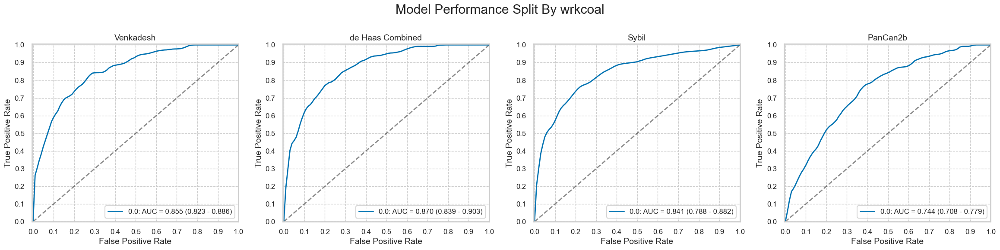

,num,pct,num_mal,pct_mal
0.0,1169,99.744027,126,10.778443
1.0,3,0.255973,1,33.333333


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1169,126,1043,106,336,707,20,0.84127,0.322148,0.15873,0.677852,0.239819,0.97249,0.760181,0.02751,0.695466,0.519122,0.373239,0.331985


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1169,126,1043,114,407,636,12,0.904762,0.390221,0.095238,0.609779,0.21881,0.981481,0.78119,0.018519,0.641574,0.514541,0.352396,0.321027


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1169,126,1043,70,96,947,56,0.555556,0.092042,0.444444,0.907958,0.421687,0.944167,0.578313,0.055833,0.869974,0.463513,0.479452,0.411799


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1169,126,1043,79,301,742,47,0.626984,0.288591,0.373016,0.711409,0.207895,0.940431,0.792105,0.059569,0.70231,0.338394,0.312253,0.224037


#### wrkcott

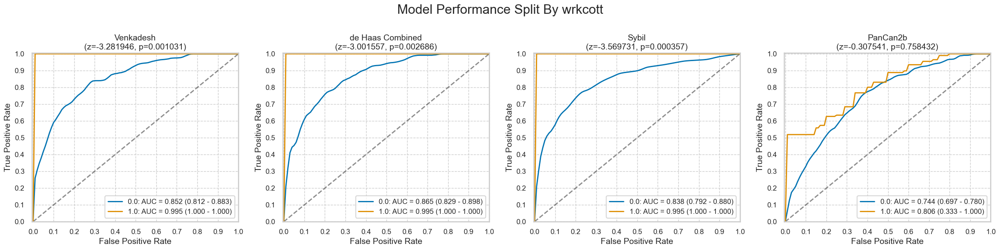

,num,pct,num_mal,pct_mal
0.0,1164,99.317406,125,10.738832
1.0,8,0.682594,2,25.000000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-3.281946,-3.001557,-3.569731,-0.307541
p,0.001031,0.002686,0.000357,0.758432


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1164,125,1039,105,335,704,20,0.84,0.322425,0.16,0.677575,0.238636,0.972376,0.761364,0.027624,0.695017,0.517575,0.371681,0.330476
1.0,8,2,6,2,1,5,0,1.00,0.166667,0.00,0.833333,0.666667,1.000000,0.333333,0.000000,0.875000,0.833333,0.800000,0.745356


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1164,125,1039,113,406,633,12,0.904,0.390760,0.096,0.609240,0.217726,0.981395,0.782274,0.018605,0.640893,0.513240,0.350932,0.319683
1.0,8,2,6,2,1,5,0,1.000,0.166667,0.000,0.833333,0.666667,1.000000,0.333333,0.000000,0.875000,0.833333,0.800000,0.745356


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1164,125,1039,71,96,943,54,0.568,0.092397,0.432,0.907603,0.42515,0.945838,0.57485,0.054162,0.871134,0.475603,0.486301,0.420051
1.0,8,2,6,0,0,6,2,0.000,0.000000,1.000,1.000000,NaN,0.750000,NaN,0.250000,0.750000,0.000000,0.000000,NaN


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1164,125,1039,79,300,739,46,0.632,0.288739,0.368,0.711261,0.208443,0.941401,0.791557,0.058599,0.702749,0.343261,0.313492,0.226795
1.0,8,2,6,1,1,5,1,0.500,0.166667,0.500,0.833333,0.500000,0.833333,0.500000,0.166667,0.750000,0.333333,0.500000,0.333333


#### wrkfarm

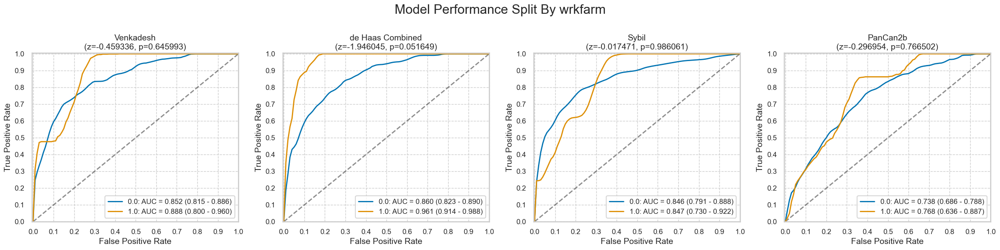

,num,pct,num_mal,pct_mal
0.0,1019,86.945392,119,11.678116
1.0,153,13.054608,8,5.228758


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.459336,-1.946045,-0.017471,-0.296954
p,0.645993,0.051649,0.986061,0.766502


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1019,119,900,99,293,607,20,0.831933,0.325556,0.168067,0.674444,0.252551,0.968102,0.747449,0.031898,0.692836,0.506377,0.387476,0.334266
1.0,153,8,145,8,43,102,0,1.000000,0.296552,0.000000,0.703448,0.156863,1.000000,0.843137,0.000000,0.718954,0.703448,0.271186,0.332182


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1019,119,900,107,362,538,12,0.89916,0.402222,0.10084,0.597778,0.228145,0.978182,0.771855,0.021818,0.632974,0.496937,0.363946,0.320205
1.0,153,8,145,8,45,100,0,1.00000,0.310345,0.00000,0.689655,0.150943,1.000000,0.849057,0.000000,0.705882,0.689655,0.262295,0.322644


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1019,119,900,68,80,820,51,0.571429,0.088889,0.428571,0.911111,0.459459,0.941447,0.540541,0.058553,0.871443,0.482540,0.509363,0.439833
1.0,153,8,145,3,16,129,5,0.375000,0.110345,0.625000,0.889655,0.157895,0.962687,0.842105,0.037313,0.862745,0.264655,0.222222,0.178641


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1019,119,900,76,266,634,43,0.638655,0.295556,0.361345,0.704444,0.222222,0.936484,0.777778,0.063516,0.696762,0.343100,0.329718,0.233350
1.0,153,8,145,4,35,110,4,0.500000,0.241379,0.500000,0.758621,0.102564,0.964912,0.897436,0.035088,0.745098,0.258621,0.170213,0.132101


#### wrkfire

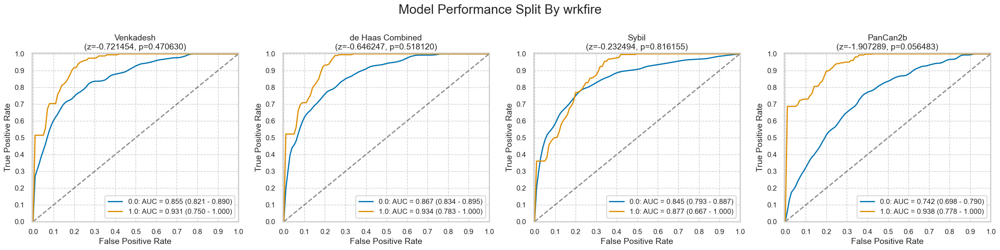

,num,pct,num_mal,pct_mal
0.0,1153,98.37884,124,10.754553
1.0,19,1.62116,3,15.789474


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.721454,-0.646247,-0.232494,-1.907289
p,0.470630,0.518120,0.816155,0.056483


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1153,124,1029,104,332,697,20,0.83871,0.322643,0.16129,0.677357,0.238532,0.972106,0.761468,0.027894,0.694709,0.516066,0.371429,0.329702
1.0,19,3,16,3,4,12,0,1.00000,0.250000,0.00000,0.750000,0.428571,1.000000,0.571429,0.000000,0.789474,0.750000,0.600000,0.566947


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1153,124,1029,112,403,626,12,0.903226,0.391642,0.096774,0.608358,0.217476,0.981191,0.782524,0.018809,0.640069,0.511583,0.350548,0.318802
1.0,19,3,16,3,4,12,0,1.000000,0.250000,0.000000,0.750000,0.428571,1.000000,0.571429,0.000000,0.789474,0.750000,0.600000,0.566947


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1153,124,1029,70,95,934,54,0.564516,0.092323,0.435484,0.907677,0.424242,0.945344,0.575758,0.054656,0.870772,0.472193,0.484429,0.417752
1.0,19,3,16,1,1,15,2,0.333333,0.062500,0.666667,0.937500,0.500000,0.882353,0.500000,0.117647,0.842105,0.270833,0.400000,0.321798


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1153,124,1029,79,300,729,45,0.637097,0.291545,0.362903,0.708455,0.208443,0.941860,0.791557,0.058140,0.700781,0.345552,0.314115,0.227898
1.0,19,3,16,1,1,15,2,0.333333,0.062500,0.666667,0.937500,0.500000,0.882353,0.500000,0.117647,0.842105,0.270833,0.400000,0.321798


#### wrkflou

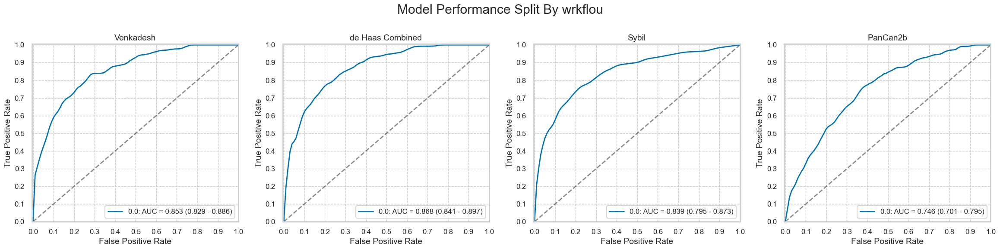

,num,pct,num_mal,pct_mal
0.0,1153,98.37884,127,11.014744
1.0,19,1.62116,0,0.000000


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1153,127,1026,107,329,697,20,0.84252,0.320663,0.15748,0.679337,0.245413,0.972106,0.754587,0.027894,0.697311,0.521857,0.380107,0.336918


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1153,127,1026,115,399,627,12,0.905512,0.388889,0.094488,0.611111,0.223735,0.981221,0.776265,0.018779,0.643539,0.516623,0.358814,0.3254


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1153,127,1026,71,94,932,56,0.559055,0.091618,0.440945,0.908382,0.430303,0.94332,0.569697,0.05668,0.869905,0.467437,0.486301,0.417906


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1153,127,1026,80,292,734,47,0.629921,0.2846,0.370079,0.7154,0.215054,0.939821,0.784946,0.060179,0.705984,0.345321,0.320641,0.23126


#### wrkfoun

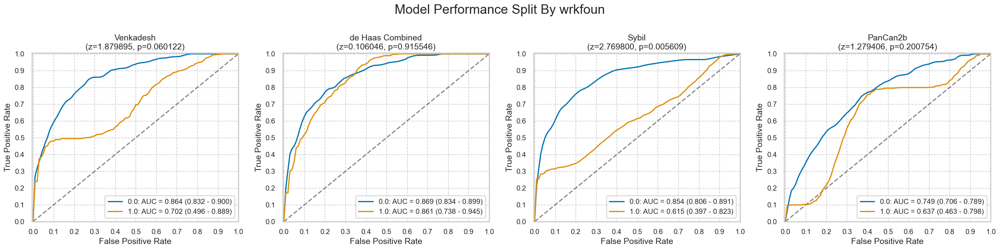

,num,pct,num_mal,pct_mal
0.0,1124,95.904437,116,10.320285
1.0,48,4.095563,11,22.916667


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,1.879895,0.106046,2.769800,1.279406
p,0.060122,0.915546,0.005609,0.200754


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1124,116,1008,100,320,688,16,0.862069,0.317460,0.137931,0.682540,0.238095,0.977273,0.761905,0.022727,0.701068,0.544609,0.373134,0.342478
1.0,48,11,37,7,16,21,4,0.636364,0.432432,0.363636,0.567568,0.304348,0.840000,0.695652,0.160000,0.583333,0.203931,0.411765,0.171572


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1124,116,1008,104,392,616,12,0.896552,0.388889,0.103448,0.611111,0.209677,0.980892,0.790323,0.019108,0.640569,0.507663,0.339869,0.311038
1.0,48,11,37,11,15,22,0,1.000000,0.405405,0.000000,0.594595,0.423077,1.000000,0.576923,0.000000,0.687500,0.594595,0.594595,0.501557


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1124,116,1008,67,91,917,49,0.577586,0.090278,0.422414,0.909722,0.424051,0.949275,0.575949,0.050725,0.875445,0.487308,0.489051,0.426527
1.0,48,11,37,4,5,32,7,0.363636,0.135135,0.636364,0.864865,0.444444,0.820513,0.555556,0.179487,0.750000,0.228501,0.400000,0.246055


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1124,116,1008,73,291,717,43,0.629310,0.28869,0.370690,0.71131,0.200549,0.943421,0.799451,0.056579,0.702847,0.340620,0.304167,0.221448
1.0,48,11,37,7,10,27,4,0.636364,0.27027,0.363636,0.72973,0.411765,0.870968,0.588235,0.129032,0.708333,0.366093,0.500000,0.321724


#### wrkhard

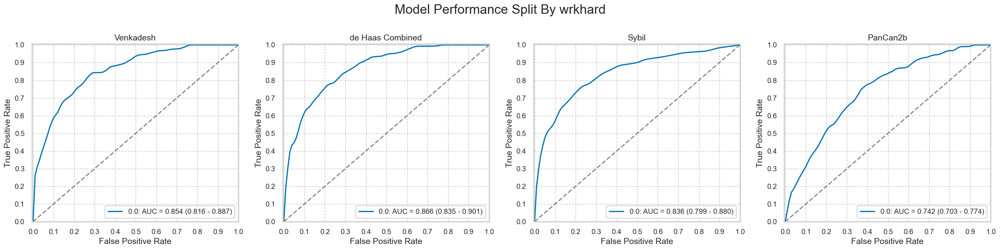

,num,pct,num_mal,pct_mal
0.0,1162,99.146758,127,10.929432
1.0,10,0.853242,0,0.000000


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1162,127,1035,107,331,704,20,0.84252,0.319807,0.15748,0.680193,0.244292,0.972376,0.755708,0.027624,0.697935,0.522713,0.378761,0.336534


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1162,127,1035,115,404,631,12,0.905512,0.390338,0.094488,0.609662,0.22158,0.981337,0.77842,0.018663,0.641997,0.515174,0.356037,0.323323


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1162,127,1035,71,96,939,56,0.559055,0.092754,0.440945,0.907246,0.42515,0.943719,0.57485,0.056281,0.869191,0.466301,0.482993,0.414733


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1162,127,1035,80,297,738,47,0.629921,0.286957,0.370079,0.713043,0.212202,0.940127,0.787798,0.059873,0.703959,0.342965,0.31746,0.228568


#### wrkpain

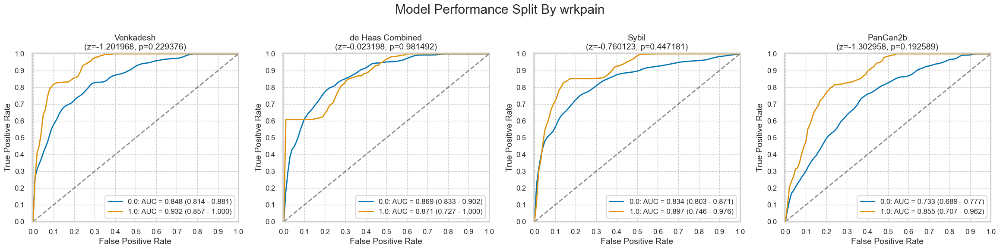

,num,pct,num_mal,pct_mal
0.0,1099,93.771331,120,10.919017
1.0,73,6.228669,7,9.589041


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-1.201968,-0.023198,-0.760123,-1.302958
p,0.229376,0.981492,0.447181,0.192589


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1099,120,979,100,316,663,20,0.833333,0.322778,0.166667,0.677222,0.240385,0.970717,0.759615,0.029283,0.694268,0.510555,0.373134,0.328297
1.0,73,7,66,7,20,46,0,1.000000,0.303030,0.000000,0.696970,0.259259,1.000000,0.740741,0.000000,0.726027,0.696970,0.411765,0.425083


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1099,120,979,109,379,600,11,0.908333,0.387130,0.091667,0.612870,0.223361,0.981997,0.776639,0.018003,0.645132,0.521204,0.358553,0.327159
1.0,73,7,66,6,28,38,1,0.857143,0.424242,0.142857,0.575758,0.176471,0.974359,0.823529,0.025641,0.602740,0.432900,0.292683,0.255527


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1099,120,979,66,90,889,54,0.550000,0.091931,0.450000,0.908069,0.423077,0.942736,0.576923,0.057264,0.868972,0.458069,0.478261,0.409350
1.0,73,7,66,5,6,60,2,0.714286,0.090909,0.285714,0.909091,0.454545,0.967742,0.545455,0.032258,0.890411,0.623377,0.555556,0.513073


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1099,120,979,74,281,698,46,0.616667,0.287028,0.383333,0.712972,0.208451,0.938172,0.791549,0.061828,0.702457,0.329639,0.311579,0.219847
1.0,73,7,66,6,20,46,1,0.857143,0.303030,0.142857,0.696970,0.230769,0.978723,0.769231,0.021277,0.712329,0.554113,0.363636,0.340709


#### wrksand

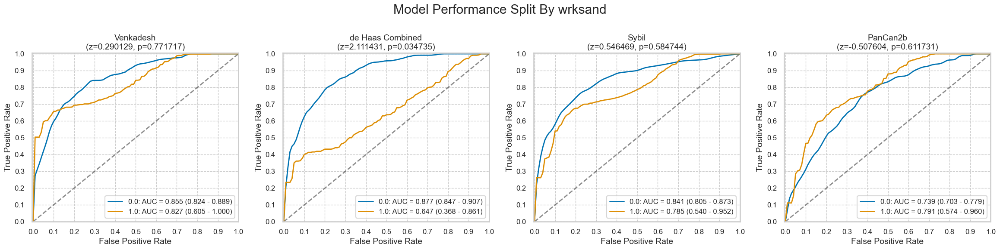

,num,pct,num_mal,pct_mal
0.0,1142,97.440273,120,10.507881
1.0,30,2.559727,7,23.333333


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.290129,2.111431,0.546469,-0.507604
p,0.771717,0.034735,0.584744,0.611731


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1142,120,1022,101,326,696,19,0.841667,0.318982,0.158333,0.681018,0.236534,0.973427,0.763466,0.026573,0.697898,0.522684,0.369287,0.331275
1.0,30,7,23,6,10,13,1,0.857143,0.434783,0.142857,0.565217,0.375000,0.928571,0.625000,0.071429,0.633333,0.422360,0.521739,0.358073


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1142,120,1022,110,394,628,10,0.916667,0.385519,0.083333,0.614481,0.218254,0.984326,0.781746,0.015674,0.646235,0.531148,0.352564,0.328024
1.0,30,7,23,5,13,10,2,0.714286,0.565217,0.285714,0.434783,0.277778,0.833333,0.722222,0.166667,0.500000,0.149068,0.400000,0.128698


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1142,120,1022,68,94,928,52,0.566667,0.091977,0.433333,0.908023,0.419753,0.946939,0.580247,0.053061,0.872154,0.474690,0.48227,0.417211
1.0,30,7,23,3,2,21,4,0.428571,0.086957,0.571429,0.913043,0.600000,0.840000,0.400000,0.160000,0.800000,0.341615,0.50000,0.387699


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1142,120,1022,75,294,728,45,0.625000,0.287671,0.375000,0.712329,0.203252,0.941785,0.796748,0.058215,0.703152,0.337329,0.306748,0.221191
1.0,30,7,23,5,7,16,2,0.714286,0.304348,0.285714,0.695652,0.416667,0.888889,0.583333,0.111111,0.700000,0.409938,0.526316,0.353919


#### wrkweld

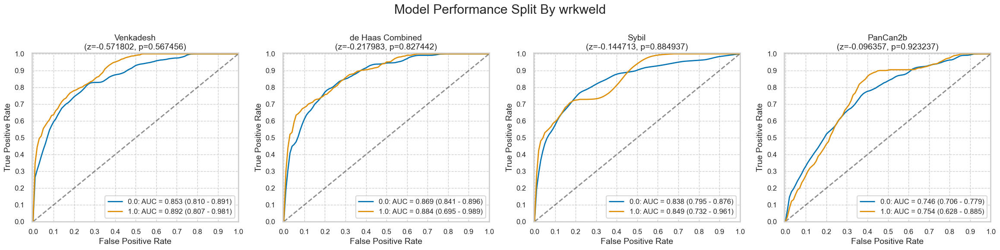

,num,pct,num_mal,pct_mal
0.0,1092,93.174061,116,10.622711
1.0,80,6.825939,11,13.750000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.571802,-0.217983,-0.144713,-0.096357
p,0.567456,0.827442,0.884937,0.923237


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1092,116,976,96,306,670,20,0.827586,0.313525,0.172414,0.686475,0.238806,0.971014,0.761194,0.028986,0.701465,0.514062,0.370656,0.328421
1.0,80,11,69,11,30,39,0,1.000000,0.434783,0.000000,0.565217,0.268293,1.000000,0.731707,0.000000,0.625000,0.565217,0.423077,0.389415


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1092,116,976,105,381,595,11,0.905172,0.390369,0.094828,0.609631,0.216049,0.981848,0.783951,0.018152,0.641026,0.514804,0.348837,0.319184
1.0,80,11,69,10,26,43,1,0.909091,0.376812,0.090909,0.623188,0.277778,0.977273,0.722222,0.022727,0.662500,0.532279,0.425532,0.368454


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1092,116,976,65,89,887,51,0.560345,0.091189,0.439655,0.908811,0.422078,0.945629,0.577922,0.054371,0.871795,0.469156,0.481481,0.415346
1.0,80,11,69,6,7,62,5,0.545455,0.101449,0.454545,0.898551,0.461538,0.925373,0.538462,0.074627,0.850000,0.444005,0.500000,0.414477


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1092,116,976,73,279,697,43,0.629310,0.285861,0.370690,0.714139,0.207386,0.941892,0.792614,0.058108,0.705128,0.343450,0.311966,0.226428
1.0,80,11,69,7,22,47,4,0.636364,0.318841,0.363636,0.681159,0.241379,0.921569,0.758621,0.078431,0.675000,0.317523,0.350000,0.227464


In [12]:
for cat in nlst_democols['cat']['work']:
    plot_by_category(nlst_preds, cat)

### Disease history

#### Emphysema

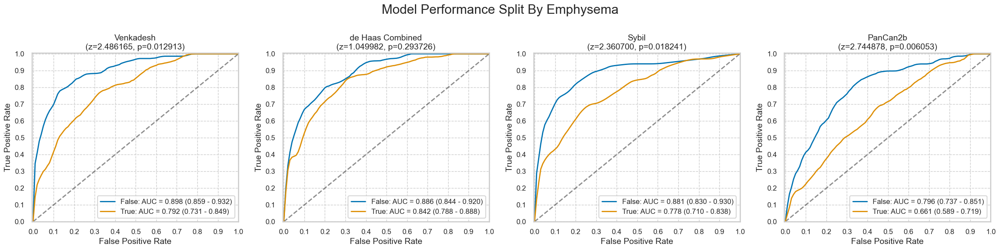

,num,pct,num_mal,pct_mal
False,733,62.542662,70,9.549795
True,439,37.457338,57,12.984055


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,2.486165,1.049982,2.360700,2.744878
p,0.012913,0.293726,0.018241,0.006053


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,733,70,663,62,200,463,8,0.885714,0.301659,0.114286,0.698341,0.236641,0.983015,0.763359,0.016985,0.716235,0.584055,0.373494,0.358178
True,439,57,382,45,136,246,12,0.789474,0.356021,0.210526,0.643979,0.248619,0.953488,0.751381,0.046512,0.662870,0.433453,0.378151,0.295980


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,733,70,663,65,252,411,5,0.928571,0.380090,0.071429,0.619910,0.205047,0.987981,0.794953,0.012019,0.649386,0.548481,0.335917,0.325380
True,439,57,382,50,155,227,7,0.877193,0.405759,0.122807,0.594241,0.243902,0.970085,0.756098,0.029915,0.630979,0.471434,0.381679,0.317618


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,733,70,663,45,52,611,25,0.642857,0.078431,0.357143,0.921569,0.463918,0.960692,0.536082,0.039308,0.894952,0.564426,0.538922,0.489551
True,439,57,382,26,44,338,31,0.456140,0.115183,0.543860,0.884817,0.371429,0.915989,0.628571,0.084011,0.829157,0.340957,0.409449,0.313045


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
False,733,70,663,49,167,496,21,0.70000,0.251885,0.30000,0.748115,0.226852,0.959381,0.773148,0.040619,0.743520,0.448115,0.342657,0.288884
True,439,57,382,31,134,248,26,0.54386,0.350785,0.45614,0.649215,0.187879,0.905109,0.812121,0.094891,0.635535,0.193074,0.279279,0.133991


In [13]:
plot_by_category(nlst_preds, 'Emphysema')

#### diagadas

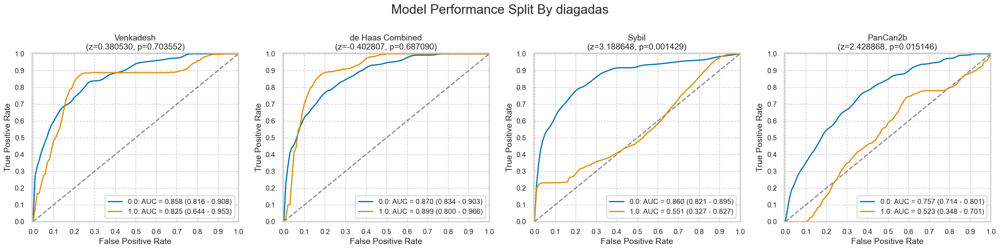

,num,pct,num_mal,pct_mal
0.0,1102,94.027304,118,10.707804
1.0,70,5.972696,9,12.857143


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.380530,-0.402807,3.188648,2.428868
p,0.703552,0.687090,0.001429,0.015146


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1102,118,984,99,308,676,19,0.838983,0.313008,0.161017,0.686992,0.243243,0.972662,0.756757,0.027338,0.703267,0.525975,0.377143,0.336988
1.0,70,9,61,8,28,33,1,0.888889,0.459016,0.111111,0.540984,0.222222,0.970588,0.777778,0.029412,0.585714,0.429872,0.355556,0.287896


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1102,118,984,106,377,607,12,0.898305,0.383130,0.101695,0.616870,0.219462,0.980614,0.780538,0.019386,0.647005,0.515175,0.352745,0.321051
1.0,70,9,61,9,30,31,0,1.000000,0.491803,0.000000,0.508197,0.230769,1.000000,0.769231,0.000000,0.571429,0.508197,0.375000,0.342456


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1102,118,984,69,83,901,49,0.584746,0.084350,0.415254,0.915650,0.453947,0.948421,0.546053,0.051579,0.880218,0.500396,0.511111,0.448713
1.0,70,9,61,2,13,48,7,0.222222,0.213115,0.777778,0.786885,0.133333,0.872727,0.866667,0.127273,0.714286,0.009107,0.166667,0.007429


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1102,118,984,76,272,712,42,0.644068,0.276423,0.355932,0.723577,0.218391,0.944297,0.781609,0.055703,0.715064,0.367645,0.326180,0.244564
1.0,70,9,61,4,29,32,5,0.444444,0.475410,0.555556,0.524590,0.121212,0.864865,0.878788,0.135135,0.514286,-0.030965,0.190476,-0.020764


#### diagasbe

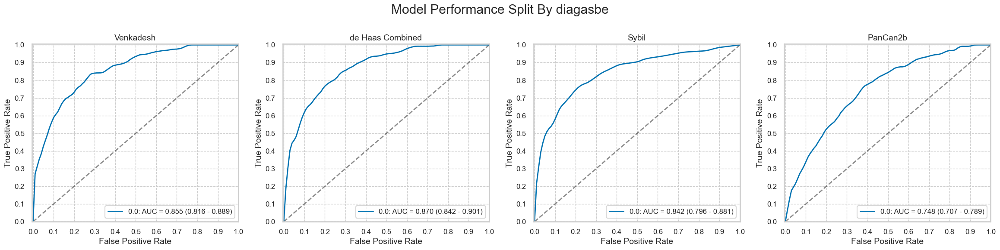

,num,pct,num_mal,pct_mal
0.0,1147,98.034188,127,11.072363
1.0,23,1.965812,0,0.000000


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1147,127,1020,107,327,693,20,0.84252,0.320588,0.15748,0.679412,0.246544,0.97195,0.753456,0.02805,0.697472,0.521931,0.381462,0.337696


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1147,127,1020,115,393,627,12,0.905512,0.385294,0.094488,0.614706,0.226378,0.981221,0.773622,0.018779,0.646905,0.520218,0.362205,0.328628


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1147,127,1020,71,93,927,56,0.559055,0.091176,0.440945,0.908824,0.432927,0.943032,0.567073,0.056968,0.870096,0.467879,0.487973,0.419408


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1147,127,1020,80,293,727,47,0.629921,0.287255,0.370079,0.712745,0.214477,0.939276,0.785523,0.060724,0.703575,0.342666,0.32,0.229535


#### diagbron

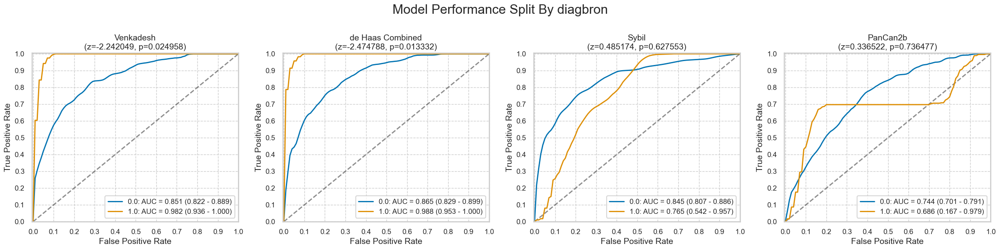

,num,pct,num_mal,pct_mal
0.0,1121,95.811966,124,11.061552
1.0,49,4.188034,3,6.122449


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-2.242049,-2.474788,0.485174,0.336522
p,0.024958,0.013332,0.627553,0.736477


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1121,124,997,104,320,677,20,0.83871,0.320963,0.16129,0.679037,0.245283,0.971306,0.754717,0.028694,0.696699,0.517747,0.379562,0.33487
1.0,49,3,46,3,15,31,0,1.00000,0.326087,0.00000,0.673913,0.166667,1.000000,0.833333,0.000000,0.693878,0.673913,0.285714,0.33514


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1121,124,997,112,393,604,12,0.903226,0.394183,0.096774,0.605817,0.221782,0.980519,0.778218,0.019481,0.638715,0.509043,0.356121,0.320905
1.0,49,3,46,3,14,32,0,1.000000,0.304348,0.000000,0.695652,0.176471,1.000000,0.823529,0.000000,0.714286,0.695652,0.300000,0.350374


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1121,124,997,71,93,904,53,0.572581,0.093280,0.427419,0.906720,0.432927,0.944619,0.567073,0.055381,0.869759,0.479301,0.493056,0.425391
1.0,49,3,46,0,3,43,3,0.000000,0.065217,1.000000,0.934783,0.000000,0.934783,1.000000,0.065217,0.877551,-0.065217,0.000000,-0.065217


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1121,124,997,78,291,706,46,0.629032,0.291876,0.370968,0.708124,0.211382,0.938830,0.788618,0.061170,0.699376,0.337157,0.316430,0.225044
1.0,49,3,46,2,9,37,1,0.666667,0.195652,0.333333,0.804348,0.181818,0.973684,0.818182,0.026316,0.795918,0.471014,0.285714,0.270636


#### diagchas

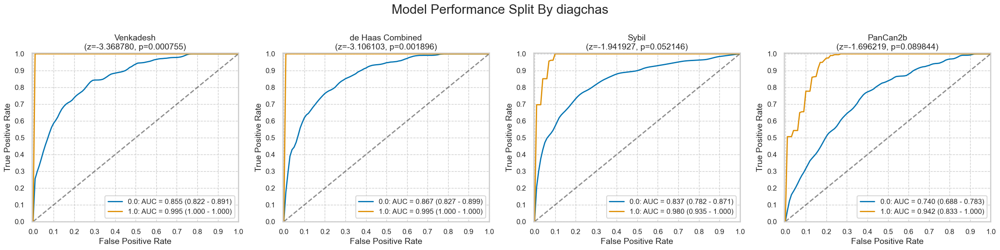

,num,pct,num_mal,pct_mal
0.0,1138,97.098976,125,10.984183
1.0,34,2.901024,2,5.882353


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-3.368780,-3.106103,-1.941927,-1.696219
p,0.000755,0.001896,0.052146,0.089844


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1138,125,1013,105,324,689,20,0.84,0.319842,0.16,0.680158,0.244755,0.971791,0.755245,0.028209,0.697715,0.520158,0.379061,0.335616
1.0,34,2,32,2,12,20,0,1.00,0.375000,0.00,0.625000,0.142857,1.000000,0.857143,0.000000,0.647059,0.625000,0.250000,0.298807


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1138,125,1013,113,391,622,12,0.904,0.385982,0.096,0.614018,0.224206,0.981073,0.775794,0.018927,0.645870,0.518018,0.3593,0.326095
1.0,34,2,32,2,16,16,0,1.000,0.500000,0.000,0.500000,0.111111,1.000000,0.888889,0.000000,0.529412,0.500000,0.2000,0.235702


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1138,125,1013,69,93,920,56,0.552,0.091807,0.448,0.908193,0.425926,0.942623,0.574074,0.057377,0.869069,0.460193,0.480836,0.41183
1.0,34,2,32,2,3,29,0,1.000,0.093750,0.000,0.906250,0.400000,1.000000,0.600000,0.000000,0.911765,0.906250,0.571429,0.60208


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1138,125,1013,78,292,721,47,0.624,0.288253,0.376,0.711747,0.210811,0.938802,0.789189,0.061198,0.702109,0.335747,0.315152,0.224125
1.0,34,2,32,2,9,23,0,1.000,0.281250,0.000,0.718750,0.181818,1.000000,0.818182,0.000000,0.735294,0.718750,0.307692,0.361499


#### diagchro

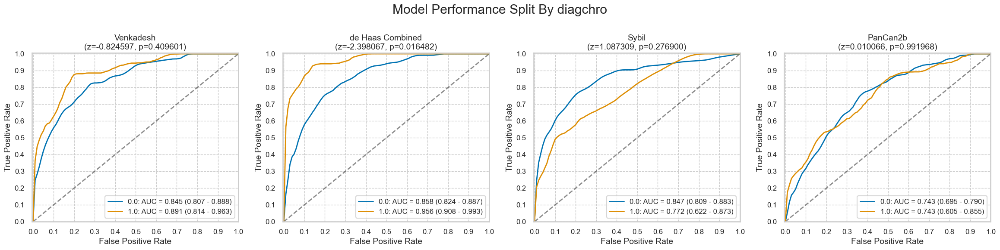

,num,pct,num_mal,pct_mal
0.0,1035,88.613014,110,10.628019
1.0,133,11.386986,17,12.781955


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.824597,-2.398067,1.087309,0.010066
p,0.409601,0.016482,0.276900,0.991968


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1035,110,925,92,291,634,18,0.836364,0.314595,0.163636,0.685405,0.240209,0.972393,0.759791,0.027607,0.701449,0.521769,0.373225,0.333060
1.0,133,17,116,15,41,75,2,0.882353,0.353448,0.117647,0.646552,0.267857,0.974026,0.732143,0.025974,0.676692,0.528905,0.410959,0.357677


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1035,110,925,98,357,568,12,0.890909,0.385946,0.109091,0.614054,0.215385,0.97931,0.784615,0.02069,0.643478,0.504963,0.346903,0.313550
1.0,133,17,116,17,47,69,0,1.000000,0.405172,0.000000,0.594828,0.265625,1.00000,0.734375,0.00000,0.646617,0.594828,0.419753,0.397493


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1035,110,925,62,76,849,48,0.563636,0.082162,0.436364,0.917838,0.449275,0.946488,0.550725,0.053512,0.880193,0.481474,0.500000,0.436520
1.0,133,17,116,9,20,96,8,0.529412,0.172414,0.470588,0.827586,0.310345,0.923077,0.689655,0.076923,0.789474,0.356998,0.391304,0.288671


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1035,110,925,69,257,668,41,0.627273,0.277838,0.372727,0.722162,0.211656,0.942172,0.788344,0.057828,0.712077,0.349435,0.316514,0.231847
1.0,133,17,116,11,43,73,6,0.647059,0.370690,0.352941,0.629310,0.203704,0.924051,0.796296,0.075949,0.631579,0.276369,0.309859,0.187903


#### diagcopd

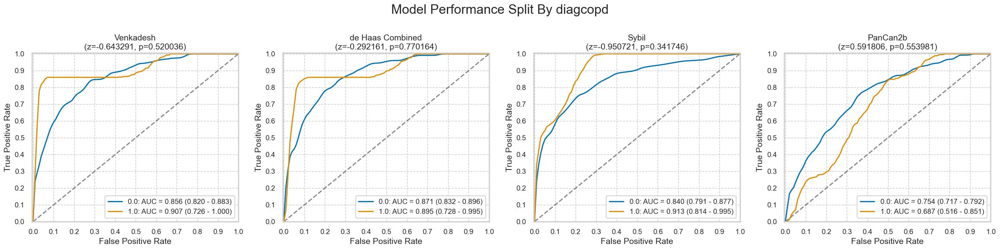

,num,pct,num_mal,pct_mal
0.0,1088,92.991453,120,11.029412
1.0,82,7.008547,7,8.536585


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.643291,-0.292161,-0.950721,0.591806
p,0.520036,0.770164,0.341746,0.553981


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1088,120,968,101,307,661,19,0.841667,0.317149,0.158333,0.682851,0.247549,0.972059,0.752451,0.027941,0.700368,0.524518,0.382576,0.339394
1.0,82,7,75,6,28,47,1,0.857143,0.373333,0.142857,0.626667,0.176471,0.979167,0.823529,0.020833,0.646341,0.483810,0.292683,0.274406


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1088,120,968,109,375,593,11,0.908333,0.387397,0.091667,0.612603,0.225207,0.981788,0.774793,0.018212,0.645221,0.520937,0.360927,0.328376
1.0,82,7,75,6,32,43,1,0.857143,0.426667,0.142857,0.573333,0.157895,0.977273,0.842105,0.022727,0.597561,0.430476,0.266667,0.241219


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1088,120,968,66,83,885,54,0.550000,0.085744,0.450000,0.914256,0.442953,0.942492,0.557047,0.057508,0.874081,0.464256,0.490706,0.423019
1.0,82,7,75,5,13,62,2,0.714286,0.173333,0.285714,0.826667,0.277778,0.968750,0.722222,0.031250,0.817073,0.540952,0.400000,0.365185


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1088,120,968,74,263,705,46,0.616667,0.271694,0.383333,0.728306,0.219585,0.938748,0.780415,0.061252,0.715993,0.344972,0.323851,0.233710
1.0,82,7,75,6,37,38,1,0.857143,0.493333,0.142857,0.506667,0.139535,0.974359,0.860465,0.025641,0.536585,0.363810,0.240000,0.203558


#### diagdiab

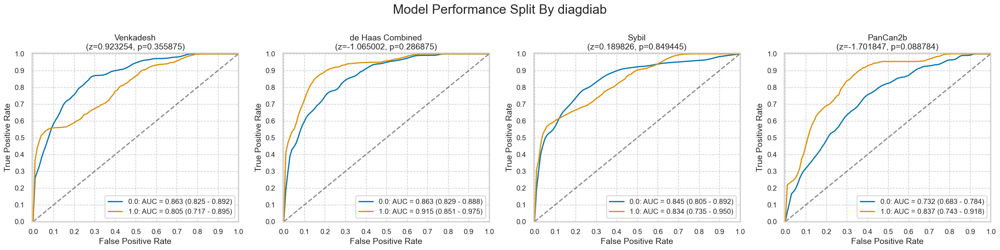

,num,pct,num_mal,pct_mal
0.0,1046,89.249147,108,10.325048
1.0,126,10.750853,19,15.079365


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.923254,-1.065002,0.189826,-1.701847
p,0.355875,0.286875,0.849445,0.088784


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1046,108,938,94,300,638,14,0.870370,0.319829,0.129630,0.680171,0.238579,0.978528,0.761421,0.021472,0.699809,0.550541,0.374502,0.345725
1.0,126,19,107,13,36,71,6,0.684211,0.336449,0.315789,0.663551,0.265306,0.922078,0.734694,0.077922,0.666667,0.347762,0.382353,0.255274


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1046,108,938,97,371,567,11,0.898148,0.395522,0.101852,0.604478,0.207265,0.980969,0.792735,0.019031,0.634799,0.502626,0.336806,0.307589
1.0,126,19,107,18,36,71,1,0.947368,0.336449,0.052632,0.663551,0.333333,0.986111,0.666667,0.013889,0.706349,0.610920,0.493151,0.441763


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1046,108,938,61,93,845,47,0.564815,0.099147,0.435185,0.900853,0.396104,0.947309,0.603896,0.052691,0.866157,0.465668,0.465649,0.399896
1.0,126,19,107,10,3,104,9,0.526316,0.028037,0.473684,0.971963,0.769231,0.920354,0.230769,0.079646,0.904762,0.498278,0.625000,0.586178


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1046,108,938,67,275,663,41,0.620370,0.293177,0.379630,0.706823,0.195906,0.941761,0.804094,0.058239,0.697897,0.327193,0.297778,0.212236
1.0,126,19,107,13,26,81,6,0.684211,0.242991,0.315789,0.757009,0.333333,0.931034,0.666667,0.068966,0.746032,0.441220,0.448276,0.341532


#### diagemph

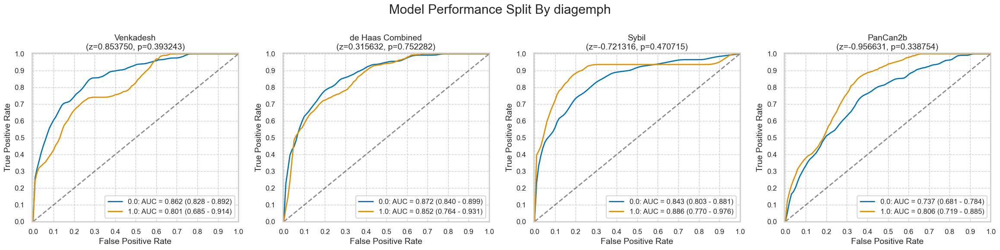

,num,pct,num_mal,pct_mal
0.0,1031,88.270548,112,10.863240
1.0,137,11.729452,15,10.948905


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.853750,0.315632,-0.721316,-0.956631
p,0.393243,0.752282,0.470715,0.338754


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1031,112,919,96,285,634,16,0.857143,0.310120,0.142857,0.689880,0.251969,0.975385,0.748031,0.024615,0.70805,0.547023,0.389452,0.352658
1.0,137,15,122,11,51,71,4,0.733333,0.418033,0.266667,0.581967,0.177419,0.946667,0.822581,0.053333,0.59854,0.315301,0.285714,0.197799


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1031,112,919,101,357,562,11,0.901786,0.388466,0.098214,0.611534,0.220524,0.980803,0.779476,0.019197,0.643065,0.513320,0.354386,0.321473
1.0,137,15,122,14,50,72,1,0.933333,0.409836,0.066667,0.590164,0.218750,0.986301,0.781250,0.013699,0.627737,0.523497,0.354430,0.327634


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1031,112,919,59,78,841,53,0.526786,0.084875,0.473214,0.915125,0.430657,0.940716,0.569343,0.059284,0.872939,0.441911,0.473896,0.405109
1.0,137,15,122,12,18,104,3,0.800000,0.147541,0.200000,0.852459,0.400000,0.971963,0.600000,0.028037,0.846715,0.652459,0.533333,0.492636


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1031,112,919,67,256,663,45,0.598214,0.278564,0.401786,0.721436,0.207430,0.936441,0.792570,0.063559,0.708050,0.319651,0.308046,0.214449
1.0,137,15,122,13,43,79,2,0.866667,0.352459,0.133333,0.647541,0.232143,0.975309,0.767857,0.024691,0.671533,0.514208,0.366197,0.326609


#### diagfibr

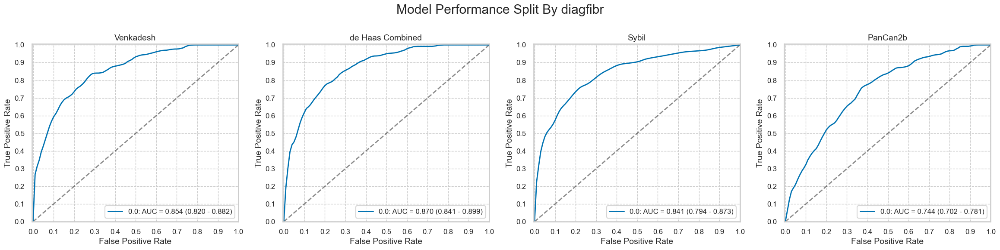

,num,pct,num_mal,pct_mal
0.0,1166,99.488055,127,10.891938
1.0,6,0.511945,0,0.000000


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1166,127,1039,107,333,706,20,0.84252,0.3205,0.15748,0.6795,0.243182,0.972452,0.756818,0.027548,0.697256,0.522019,0.377425,0.335507


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1166,127,1039,115,401,638,12,0.905512,0.385948,0.094488,0.614052,0.222868,0.981538,0.777132,0.018462,0.645798,0.519564,0.357698,0.325887


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1166,127,1039,71,94,945,56,0.559055,0.090472,0.440945,0.909528,0.430303,0.944056,0.569697,0.055944,0.871355,0.468584,0.486301,0.41883


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1166,127,1039,80,299,740,47,0.629921,0.287777,0.370079,0.712223,0.211082,0.94028,0.788918,0.05972,0.703259,0.342145,0.316206,0.227569


#### diaghear

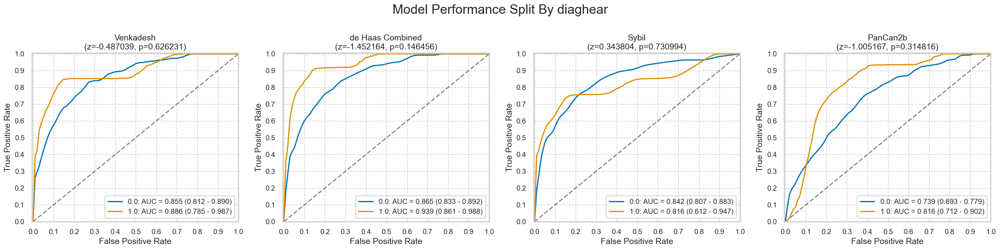

,num,pct,num_mal,pct_mal
0.0,1017,87.071918,114,11.209440
1.0,151,12.928082,13,8.609272


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.487039,-1.452164,0.343804,-1.005167
p,0.626231,0.146456,0.730994,0.314816


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1017,114,903,96,278,625,18,0.842105,0.307863,0.157895,0.692137,0.256684,0.972006,0.743316,0.027994,0.708948,0.534243,0.393443,0.349537
1.0,151,13,138,11,58,80,2,0.846154,0.420290,0.153846,0.579710,0.159420,0.975610,0.840580,0.024390,0.602649,0.425864,0.268293,0.239801


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1017,114,903,102,351,552,12,0.894737,0.388704,0.105263,0.611296,0.225166,0.978723,0.774834,0.021277,0.643068,0.506033,0.359788,0.321208
1.0,151,13,138,13,56,82,0,1.000000,0.405797,0.000000,0.594203,0.188406,1.000000,0.811594,0.000000,0.629139,0.594203,0.317073,0.334591


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1017,114,903,63,85,818,51,0.552632,0.094131,0.447368,0.905869,0.425676,0.941312,0.574324,0.058688,0.866273,0.458501,0.480916,0.410200
1.0,151,13,138,8,11,127,5,0.615385,0.079710,0.384615,0.920290,0.421053,0.962121,0.578947,0.037879,0.894040,0.535674,0.500000,0.453052


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1017,114,903,70,261,642,44,0.614035,0.289037,0.385965,0.710963,0.211480,0.935860,0.788520,0.064140,0.700098,0.324999,0.314607,0.218827
1.0,151,13,138,10,38,100,3,0.769231,0.275362,0.230769,0.724638,0.208333,0.970874,0.791667,0.029126,0.728477,0.493868,0.327869,0.297497


#### diaghype

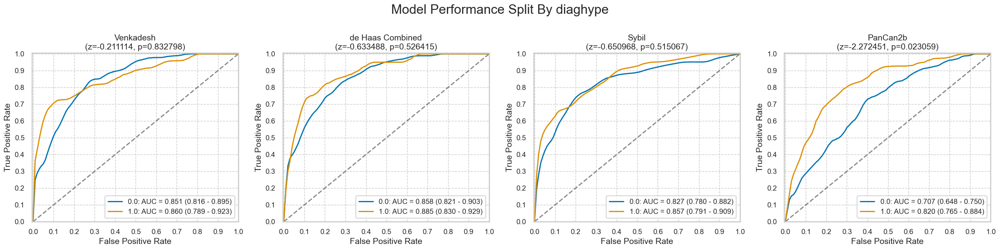

,num,pct,num_mal,pct_mal
0.0,778,66.609589,80,10.282776
1.0,390,33.390411,44,11.282051


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.211114,-0.633488,-0.650968,-2.272451
p,0.832798,0.526415,0.515067,0.023059


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,778,80,698,68,223,475,12,0.850000,0.319484,0.150000,0.680516,0.233677,0.975359,0.766323,0.024641,0.697943,0.530516,0.366577,0.333012
1.0,390,44,346,36,113,233,8,0.818182,0.326590,0.181818,0.673410,0.241611,0.966805,0.758389,0.033195,0.689744,0.491592,0.373057,0.320087


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,778,80,698,70,266,432,10,0.875000,0.381089,0.125000,0.618911,0.208333,0.977376,0.791667,0.022624,0.645244,0.493911,0.336538,0.302859
1.0,390,44,346,42,141,205,2,0.954545,0.407514,0.045455,0.592486,0.229508,0.990338,0.770492,0.009662,0.633333,0.547031,0.370044,0.346789


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,778,80,698,41,68,630,39,0.512500,0.097421,0.487500,0.902579,0.376147,0.941704,0.623853,0.058296,0.862468,0.415079,0.433862,0.363226
1.0,390,44,346,27,28,318,17,0.613636,0.080925,0.386364,0.919075,0.490909,0.949254,0.509091,0.050746,0.884615,0.532712,0.545455,0.484231


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,778,80,698,45,214,484,35,0.5625,0.306590,0.4375,0.693410,0.173745,0.932563,0.826255,0.067437,0.679949,0.255910,0.265487,0.164940
1.0,390,44,346,33,87,259,11,0.7500,0.251445,0.2500,0.748555,0.275000,0.959259,0.725000,0.040741,0.748718,0.498555,0.402439,0.341747


#### diagpneu

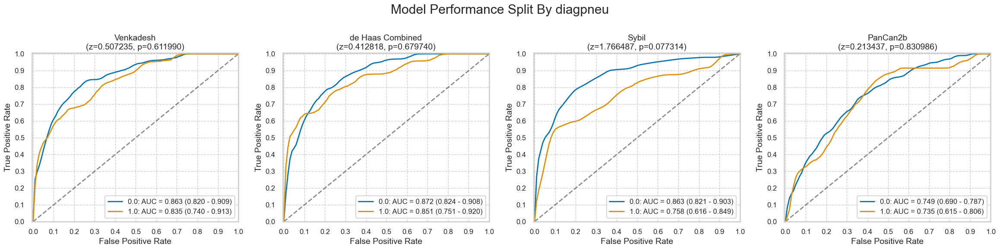

,num,pct,num_mal,pct_mal
0.0,897,76.535836,102,11.371237
1.0,275,23.464164,25,9.090909


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.507235,0.412818,1.766487,0.213437
p,0.611990,0.679740,0.077314,0.830986


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,897,102,795,86,242,553,16,0.843137,0.304403,0.156863,0.695597,0.262195,0.97188,0.737805,0.02812,0.712375,0.538735,0.4,0.355112
1.0,275,25,250,21,94,156,4,0.840000,0.376000,0.160000,0.624000,0.182609,0.97500,0.817391,0.02500,0.643636,0.464000,0.3,0.270426


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,897,102,795,93,311,484,9,0.911765,0.391195,0.088235,0.608805,0.230198,0.981744,0.769802,0.018256,0.643255,0.52057,0.367589,0.332161
1.0,275,25,250,22,96,154,3,0.880000,0.384000,0.120000,0.616000,0.186441,0.980892,0.813559,0.019108,0.640000,0.49600,0.307692,0.288092


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,897,102,795,57,64,731,45,0.558824,0.080503,0.441176,0.919497,0.471074,0.942010,0.528926,0.057990,0.878484,0.47832,0.511211,0.444507
1.0,275,25,250,14,32,218,11,0.560000,0.128000,0.440000,0.872000,0.304348,0.951965,0.695652,0.048035,0.843636,0.43200,0.394366,0.332757


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,897,102,795,63,218,577,39,0.617647,0.274214,0.382353,0.725786,0.224199,0.936688,0.775801,0.063312,0.713489,0.343433,0.328982,0.235062
1.0,275,25,250,17,83,167,8,0.680000,0.332000,0.320000,0.668000,0.170000,0.954286,0.830000,0.045714,0.669091,0.348000,0.272000,0.207970


#### diagsarc

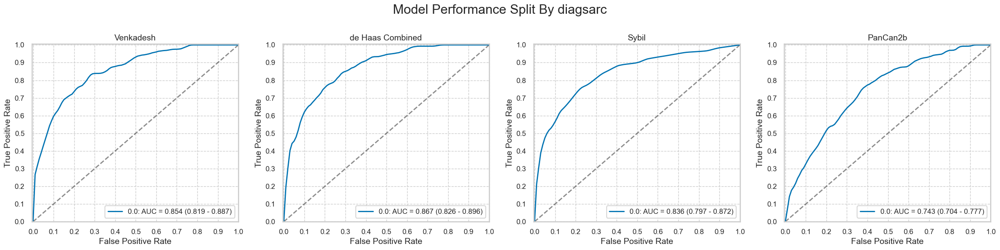

,num,pct,num_mal,pct_mal
0.0,1170,99.829352,126,10.769231
1.0,2,0.170648,1,50.000000


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1170,126,1044,106,335,709,20,0.84127,0.320881,0.15873,0.679119,0.240363,0.972565,0.759637,0.027435,0.696581,0.520389,0.373898,0.332874


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1170,126,1044,114,406,638,12,0.904762,0.388889,0.095238,0.611111,0.219231,0.981538,0.780769,0.018462,0.642735,0.515873,0.352941,0.321825


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1170,126,1044,70,96,948,56,0.555556,0.091954,0.444444,0.908046,0.421687,0.944223,0.578313,0.055777,0.870085,0.463602,0.479452,0.411869


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1170,126,1044,79,300,744,47,0.626984,0.287356,0.373016,0.712644,0.208443,0.940582,0.791557,0.059418,0.703419,0.339628,0.312871,0.224973


#### diagsili

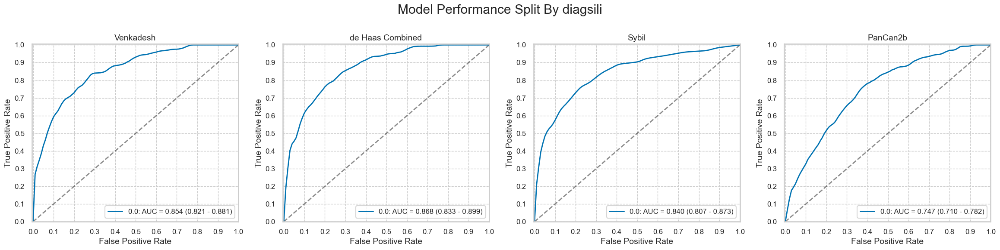

,num,pct,num_mal,pct_mal
0.0,1170,99.829352,127,10.854701
1.0,2,0.170648,0,0.000000


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1170,127,1043,107,336,707,20,0.84252,0.322148,0.15748,0.677852,0.241535,0.97249,0.758465,0.02751,0.695726,0.520372,0.375439,0.333725


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1170,127,1043,115,405,638,12,0.905512,0.388303,0.094488,0.611697,0.221154,0.981538,0.778846,0.018462,0.64359,0.517209,0.355487,0.323781


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1170,127,1043,71,96,947,56,0.559055,0.092042,0.440945,0.907958,0.42515,0.944167,0.57485,0.055833,0.870085,0.467013,0.482993,0.415302


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1170,127,1043,80,301,742,47,0.629921,0.288591,0.370079,0.711409,0.209974,0.940431,0.790026,0.059569,0.702564,0.341331,0.314961,0.226578


#### diagstro

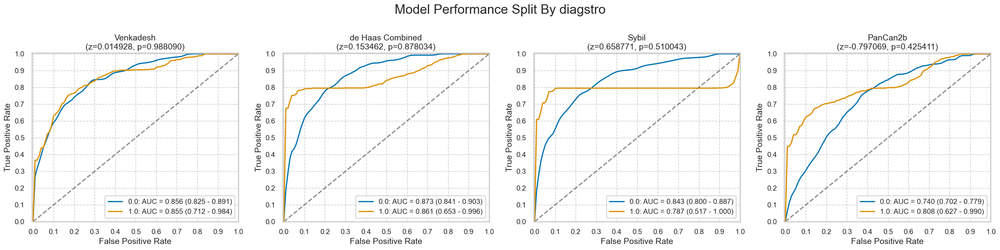

,num,pct,num_mal,pct_mal
0.0,1129,96.331058,117,10.363153
1.0,43,3.668942,10,23.255814


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.014928,0.153462,0.658771,-0.797069
p,0.988090,0.878034,0.510043,0.425411


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1129,117,1012,99,329,683,18,0.846154,0.325099,0.153846,0.674901,0.231308,0.974322,0.768692,0.025678,0.692648,0.521055,0.363303,0.327330
1.0,43,10,33,8,7,26,2,0.800000,0.212121,0.200000,0.787879,0.533333,0.928571,0.466667,0.071429,0.790698,0.587879,0.640000,0.521099


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1129,117,1012,107,393,619,10,0.91453,0.388340,0.08547,0.611660,0.214000,0.984102,0.786000,0.015898,0.643047,0.526190,0.34684,0.322861
1.0,43,10,33,8,14,19,2,0.80000,0.424242,0.20000,0.575758,0.363636,0.904762,0.636364,0.095238,0.627907,0.375758,0.50000,0.317573


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1129,117,1012,63,95,917,54,0.538462,0.093874,0.461538,0.906126,0.398734,0.944387,0.601266,0.055613,0.868025,0.444588,0.458182,0.390574
1.0,43,10,33,8,1,32,2,0.800000,0.030303,0.200000,0.969697,0.888889,0.941176,0.111111,0.058824,0.930233,0.769697,0.842105,0.799311


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1129,117,1012,73,294,718,44,0.623932,0.290514,0.376068,0.709486,0.19891,0.942257,0.80109,0.057743,0.700620,0.333418,0.301653,0.216951
1.0,43,10,33,7,7,26,3,0.700000,0.212121,0.300000,0.787879,0.50000,0.896552,0.50000,0.103448,0.767442,0.487879,0.583333,0.439851


#### diagtube

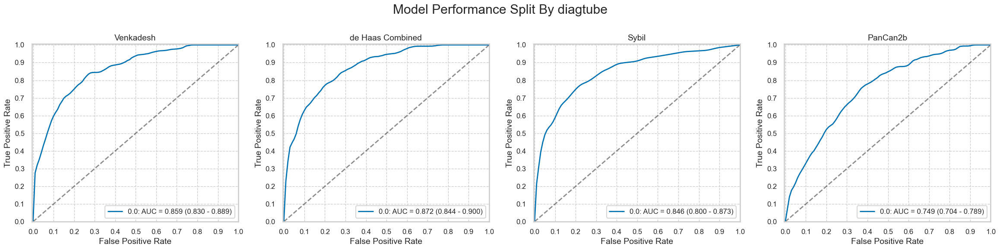

,num,pct,num_mal,pct_mal
0.0,1148,97.952218,127,11.062718
1.0,24,2.047782,0,0.000000


More than binary: not computing significance test results.
Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1148,127,1021,107,320,701,20,0.84252,0.313418,0.15748,0.686582,0.250585,0.972261,0.749415,0.027739,0.703833,0.529101,0.386282,0.343378


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1148,127,1021,115,391,630,12,0.905512,0.382958,0.094488,0.617042,0.227273,0.981308,0.772727,0.018692,0.648955,0.522554,0.363349,0.330144


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1148,127,1021,71,91,930,56,0.559055,0.089128,0.440945,0.910872,0.438272,0.943205,0.561728,0.056795,0.871951,0.469927,0.491349,0.423398


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
0.0,1148,127,1021,80,290,731,47,0.629921,0.284035,0.370079,0.715965,0.216216,0.939589,0.783784,0.060411,0.706446,0.345886,0.321932,0.232144


In [14]:
for cat in nlst_democols['cat']['disease']:
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

#### height

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,68.096651,3.856283,59.0,65.0,68.0,71.0,78.0
1,127.0,68.417323,3.736225,60.0,66.0,69.0,71.0,76.0


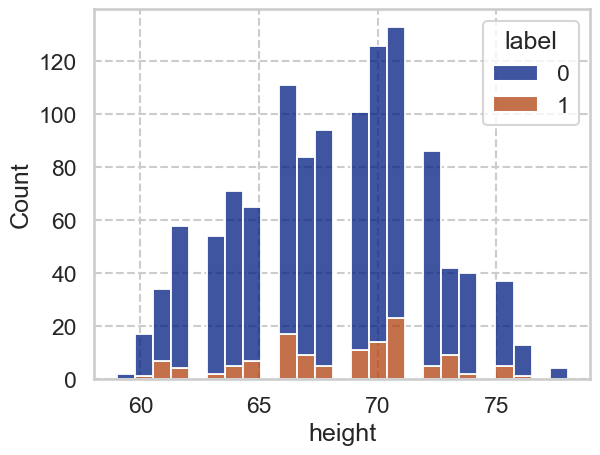

#### weight

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1044.0,183.356322,39.848243,90.0,157.0,180.0,206.0,315.0
1,127.0,178.244094,36.405720,108.0,157.0,180.0,200.0,322.0


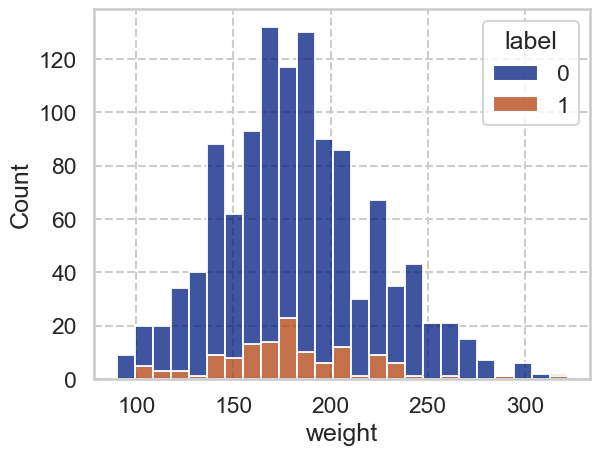

#### Age

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,63.199043,5.379523,55.0,59.0,62.0,67.0,76.0
1,127.0,64.062992,5.226228,55.0,60.5,63.0,68.0,75.0


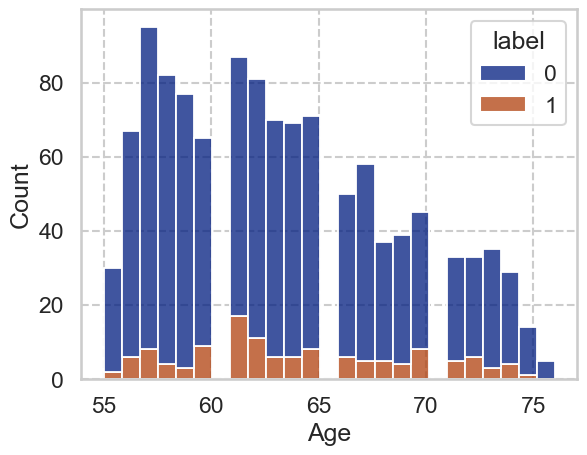

#### BMI

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1044.0,27.651995,4.893146,16.242386,24.271788,27.258353,30.685928,51.010481
1,127.0,26.658295,4.558551,18.302959,23.745543,25.824490,29.130280,47.587692


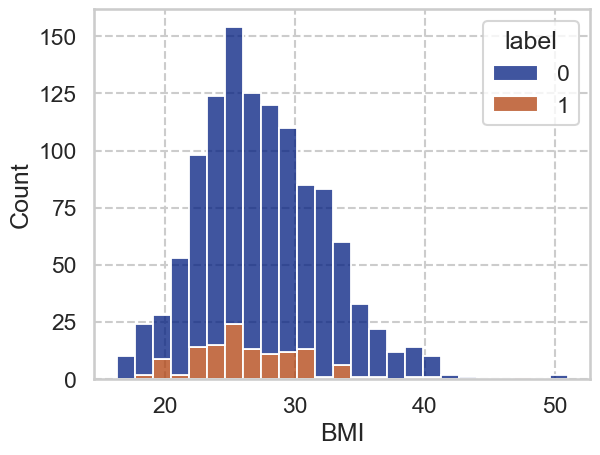

In [15]:
for c in nlst_democols['num']['demo']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              height  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_height                                                                  
(58.999, 68.0]  590.0  0.096610  0.295677  0.0  0.0  0.0  0.0  1.0  590.0   
(68.0, 78.0]    582.0  0.120275  0.325563  0.0  0.0  0.0  0.0  1.0  582.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_height                                                         
(58.999, 68.0]  64.957627  2.309624  59.0  63.0  65.0  67.0  68.0  
(68.0, 78.0]    71.348797  1.939797  69.0  70.0  71.0  72.0  78.0

#### bin_height

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


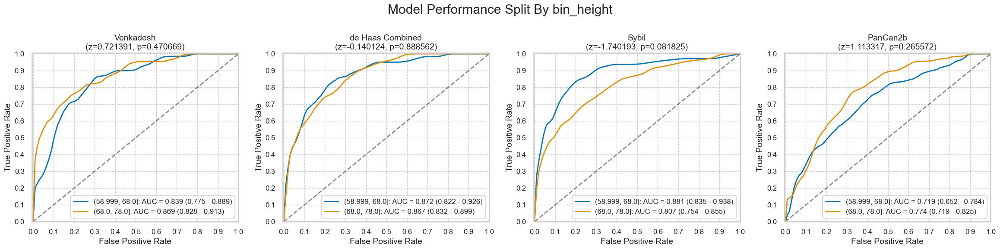

,num,pct,num_mal,pct_mal
"(58.999, 68.0]",590,50.341297,57,9.661017
"(68.0, 78.0]",582,49.658703,70,12.027491


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.721391,-0.140124,-1.740193,1.113317
p,0.470669,0.888562,0.081825,0.265572


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(58.999, 68.0]",590,57,533,49,180,353,8,0.859649,0.337711,0.140351,0.662289,0.213974,0.977839,0.786026,0.022161,0.681356,0.521938,0.342657,0.316409
"(68.0, 78.0]",582,70,512,58,156,356,12,0.828571,0.304688,0.171429,0.695312,0.271028,0.967391,0.728972,0.032609,0.711340,0.523884,0.408451,0.353418


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(58.999, 68.0]",590,57,533,52,219,314,5,0.912281,0.410882,0.087719,0.589118,0.191882,0.984326,0.808118,0.015674,0.620339,0.501399,0.317073,0.297238
"(68.0, 78.0]",582,70,512,63,188,324,7,0.900000,0.367188,0.100000,0.632812,0.250996,0.978852,0.749004,0.021148,0.664948,0.532813,0.392523,0.349951


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(58.999, 68.0]",590,57,533,35,50,483,22,0.614035,0.093809,0.385965,0.906191,0.411765,0.956436,0.588235,0.043564,0.877966,0.520226,0.492958,0.437661
"(68.0, 78.0]",582,70,512,36,46,466,34,0.514286,0.089844,0.485714,0.910156,0.439024,0.932000,0.560976,0.068000,0.862543,0.424442,0.473684,0.396835


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(58.999, 68.0]",590,57,533,37,183,350,20,0.649123,0.343340,0.350877,0.656660,0.168182,0.945946,0.831818,0.054054,0.655932,0.305783,0.267148,0.186811
"(68.0, 78.0]",582,70,512,43,118,394,27,0.614286,0.230469,0.385714,0.769531,0.267081,0.935867,0.732919,0.064133,0.750859,0.383817,0.372294,0.279096


C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              weight  \
                 count      mean       std  min  25%  50%  75%  max  count   
bin_weight                                                                   
(89.999, 180.0]  605.0  0.120661  0.326003  0.0  0.0  0.0  0.0  1.0  605.0   
(180.0, 322.0]   566.0  0.095406  0.294035  0.0  0.0  0.0  0.0  1.0  566.0   

                                                                           
                       mean        std    min    25%    50%    75%    max  
bin_weight                                                                 
(89.999, 180.0]  152.778512  21.066998   90.0  140.0  158.0  170.0  180.0  
(180.0, 322.0]   214.893993  27.580217  181.0  193.0  206.0  230.0  322.0

#### bin_weight

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


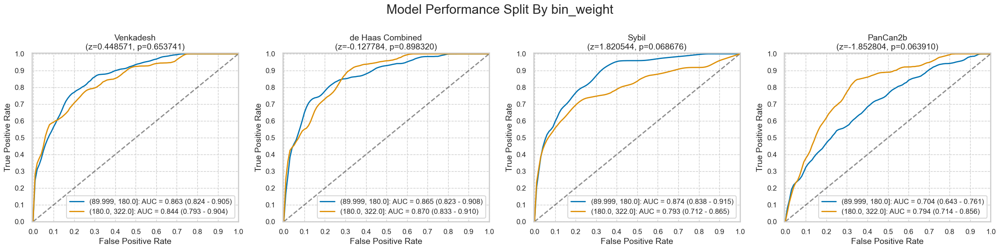

,num,pct,num_mal,pct_mal
"(89.999, 180.0]",605,51.665243,73,12.066116
"(180.0, 322.0]",566,48.334757,54,9.540636


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.448571,-0.127784,1.820544,-1.852804
p,0.653741,0.898320,0.068676,0.063910


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(89.999, 180.0]",605,73,532,64,183,349,9,0.876712,0.343985,0.123288,0.656015,0.259109,0.97486,0.740891,0.02514,0.682645,0.532727,0.400000,0.353047
"(180.0, 322.0]",566,54,512,43,152,360,11,0.796296,0.296875,0.203704,0.703125,0.220513,0.97035,0.779487,0.02965,0.712014,0.499421,0.345382,0.308741


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(89.999, 180.0]",605,73,532,65,226,306,8,0.890411,0.424812,0.109589,0.575188,0.223368,0.974522,0.776632,0.025478,0.613223,0.465599,0.357143,0.303541
"(180.0, 322.0]",566,54,512,50,180,332,4,0.925926,0.351562,0.074074,0.648438,0.217391,0.988095,0.782609,0.011905,0.674912,0.574363,0.352113,0.343546


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(89.999, 180.0]",605,73,532,41,50,482,32,0.561644,0.093985,0.438356,0.906015,0.450549,0.937743,0.549451,0.062257,0.864463,0.467659,0.500000,0.426132
"(180.0, 322.0]",566,54,512,30,45,467,24,0.555556,0.087891,0.444444,0.912109,0.400000,0.951120,0.600000,0.048880,0.878092,0.467665,0.465116,0.405224


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(89.999, 180.0]",605,73,532,45,186,346,28,0.616438,0.349624,0.383562,0.650376,0.194805,0.925134,0.805195,0.074866,0.646281,0.266814,0.296053,0.178889
"(180.0, 322.0]",566,54,512,35,114,398,19,0.648148,0.222656,0.351852,0.777344,0.234899,0.954436,0.765101,0.045564,0.765018,0.425492,0.344828,0.283832


C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 Age  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_Age                                                                     
(54.999, 63.0]  654.0  0.100917  0.301450  0.0  0.0  0.0  0.0  1.0  654.0   
(63.0, 76.0]    518.0  0.117761  0.322636  0.0  0.0  0.0  0.0  1.0  518.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_Age                                                           
(54.999, 63.0]  59.25841  2.400654  55.0  57.0  59.0  61.0  63.0  
(63.0, 76.0]    68.38610  3.376096  64.0  65.0  68.0  71.0  76.0

#### bin_Age

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


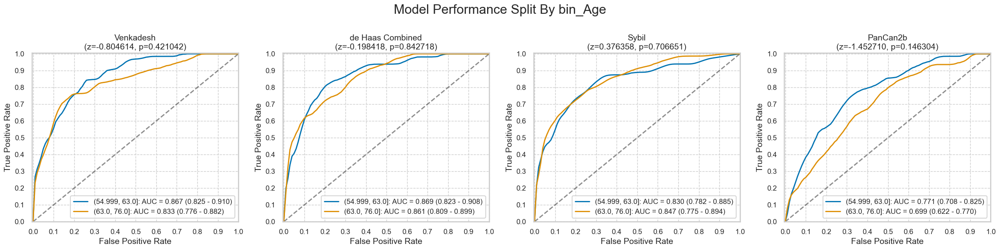

,num,pct,num_mal,pct_mal
"(54.999, 63.0]",654,55.802048,66,10.091743
"(63.0, 76.0]",518,44.197952,61,11.776062


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.804614,-0.198418,0.376358,-1.452710
p,0.421042,0.842718,0.706651,0.146304


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(54.999, 63.0]",654,66,588,56,169,419,10,0.848485,0.287415,0.151515,0.712585,0.248889,0.976690,0.751111,0.023310,0.726300,0.561070,0.384880,0.355760
"(63.0, 76.0]",518,61,457,51,167,290,10,0.836066,0.365427,0.163934,0.634573,0.233945,0.966667,0.766055,0.033333,0.658301,0.470639,0.365591,0.307271


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(54.999, 63.0]",654,66,588,60,218,370,6,0.909091,0.370748,0.090909,0.629252,0.215827,0.984043,0.784173,0.015957,0.657492,0.538343,0.348837,0.328022
"(63.0, 76.0]",518,61,457,55,189,268,6,0.901639,0.413567,0.098361,0.586433,0.225410,0.978102,0.774590,0.021898,0.623552,0.488073,0.360656,0.315164


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(54.999, 63.0]",654,66,588,33,49,539,33,0.500000,0.083333,0.500000,0.916667,0.402439,0.942308,0.597561,0.057692,0.874618,0.416667,0.445946,0.379005
"(63.0, 76.0]",518,61,457,38,47,410,23,0.622951,0.102845,0.377049,0.897155,0.447059,0.946882,0.552941,0.053118,0.864865,0.520106,0.520548,0.452649


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(54.999, 63.0]",654,66,588,41,143,445,25,0.621212,0.243197,0.378788,0.756803,0.222826,0.946809,0.777174,0.053191,0.743119,0.378015,0.328000,0.253228
"(63.0, 76.0]",518,61,457,39,158,299,22,0.639344,0.345733,0.360656,0.654267,0.197970,0.931464,0.802030,0.068536,0.652510,0.293611,0.302326,0.194944


C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\33758728.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 BMI  \
                  count      mean       std  min  25%  50%  75%  max  count   
bin_BMI                                                                       
(16.241, 27.044]  586.0  0.127986  0.334360  0.0  0.0  0.0  0.0  1.0  586.0   
(27.044, 51.01]   585.0  0.088889  0.284827  0.0  0.0  0.0  0.0  1.0  585.0   

                                                                        \
                       mean       std        min        25%        50%   
bin_BMI                                                                  
(16.241, 27.044]  23.719689  2.357405  16.242386  22.440233  24.221202   
(27.044, 51.01]   31.375296  3.534062  27.092671  28.734213  30.565217   

                                        
                        75%        max  
bin_BMI                                 
(16.241, 27.044]  25.716379  27.043535  
(27.044, 51.01]   33.190637  51.010481

#### bin_BMI

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


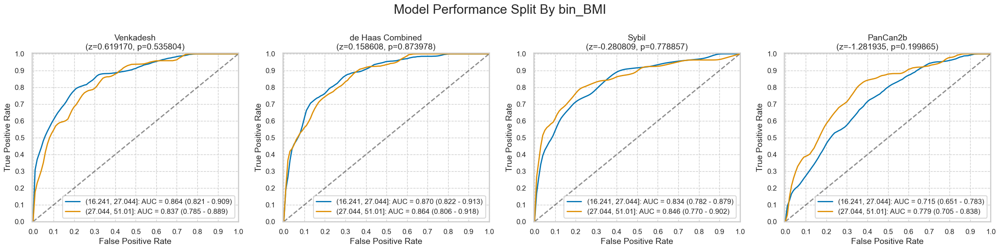

,num,pct,num_mal,pct_mal
"(16.241, 27.044]",586,50.042699,75,12.798635
"(27.044, 51.01]",585,49.957301,52,8.888889


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.619170,0.158608,-0.280809,-1.281935
p,0.535804,0.873978,0.778857,0.199865


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(16.241, 27.044]",586,75,511,66,179,332,9,0.880000,0.350294,0.120000,0.649706,0.269388,0.973607,0.730612,0.026393,0.679181,0.529706,0.412500,0.358770
"(27.044, 51.01]",585,52,533,41,156,377,11,0.788462,0.292683,0.211538,0.707317,0.208122,0.971649,0.791878,0.028351,0.714530,0.495779,0.329317,0.298541


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(16.241, 27.044]",586,75,511,68,209,302,7,0.906667,0.409002,0.093333,0.590998,0.245487,0.977346,0.754513,0.022654,0.631399,0.497665,0.386364,0.333011
"(27.044, 51.01]",585,52,533,47,197,336,5,0.903846,0.369606,0.096154,0.630394,0.192623,0.985337,0.807377,0.014663,0.654701,0.534240,0.317568,0.308340


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(16.241, 27.044]",586,75,511,40,50,461,35,0.533333,0.097847,0.466667,0.902153,0.444444,0.929435,0.555556,0.070565,0.854949,0.435486,0.484848,0.403509
"(27.044, 51.01]",585,52,533,31,45,488,21,0.596154,0.084428,0.403846,0.915572,0.407895,0.958743,0.592105,0.041257,0.887179,0.511726,0.484375,0.433149


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(16.241, 27.044]",586,75,511,46,166,345,29,0.613333,0.324853,0.386667,0.675147,0.216981,0.922460,0.783019,0.077540,0.667235,0.288480,0.320557,0.200564
"(27.044, 51.01]",585,52,533,34,134,399,18,0.653846,0.251407,0.346154,0.748593,0.202381,0.956835,0.797619,0.043165,0.740171,0.402439,0.309091,0.253129


In [16]:
for c in nlst_democols['num']['demo']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

In [17]:
# nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
# display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
# plot_by_category(nlst_preds, f'bin_height')

In [18]:
# nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
# display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
# plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

#### pkyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,56.656603,22.031699,30.0,40.00,50.0,67.50,162.0
1,127.0,70.186220,29.608258,30.0,49.75,64.5,84.75,224.0


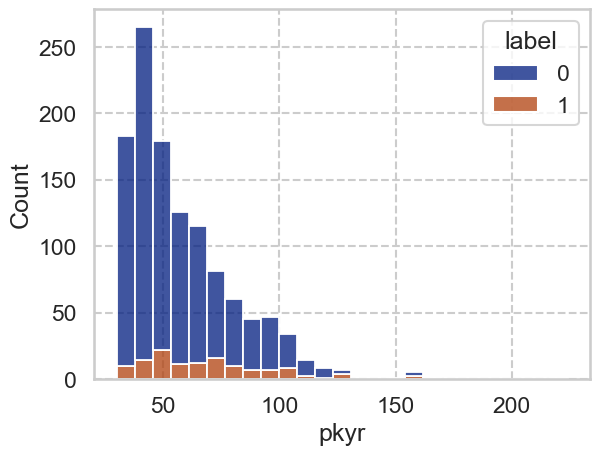

#### smokeage

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,16.448804,3.476042,5.0,14.0,16.0,18.0,40.0
1,127.0,16.220472,3.231574,8.0,14.0,16.0,18.0,26.0


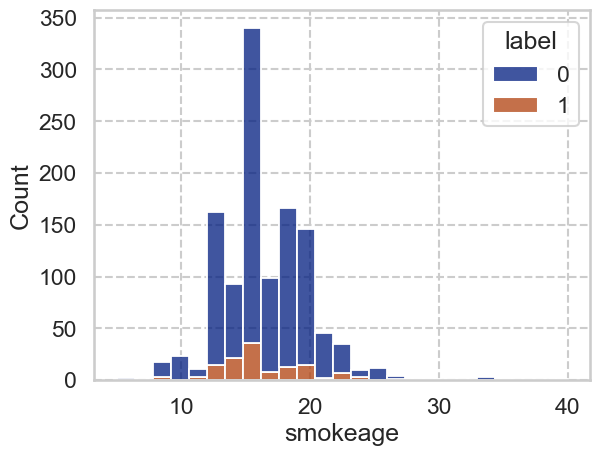

#### smokeday

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,28.328230,11.434740,12.0,20.0,25.0,32.0,80.0
1,127.0,31.818898,12.065573,18.0,20.0,30.0,40.0,80.0


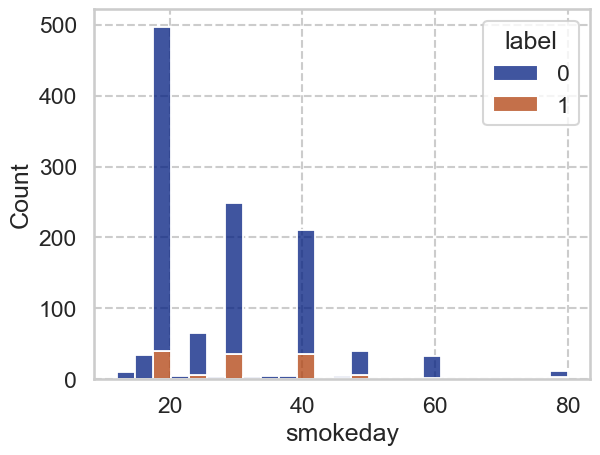

#### smokeyr

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,40.886124,7.696808,17.0,36.0,41.0,46.0,61.0
1,127.0,44.086614,7.219928,29.0,39.0,44.0,49.0,65.0


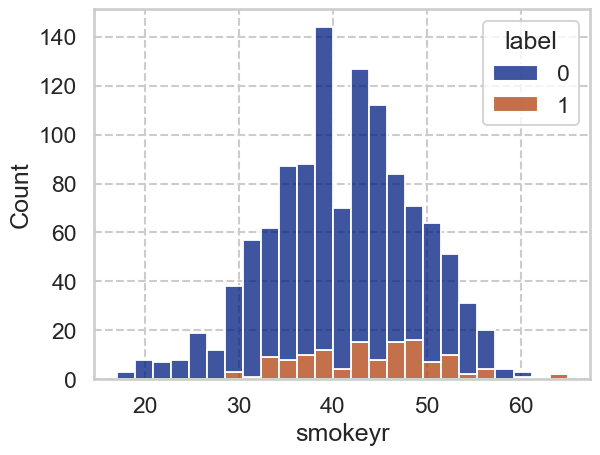

In [19]:
for c in nlst_democols['num']['smoke']:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                pkyr  \
                count      mean       std  min  25%  50%  75%  max  count   
bin_pkyr                                                                    
(29.999, 52.0]  601.0  0.063228  0.243575  0.0  0.0  0.0  0.0  1.0  601.0   
(52.0, 224.0]   571.0  0.155867  0.363047  0.0  0.0  0.0  0.0  1.0  571.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_pkyr                                                             
(29.999, 52.0]  40.953411   6.072504  30.0  36.0  41.0  46.0   52.0  
(52.0, 224.0]   76.194046  21.033603  52.5  60.0  70.0  88.0  224.0

#### bin_pkyr

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


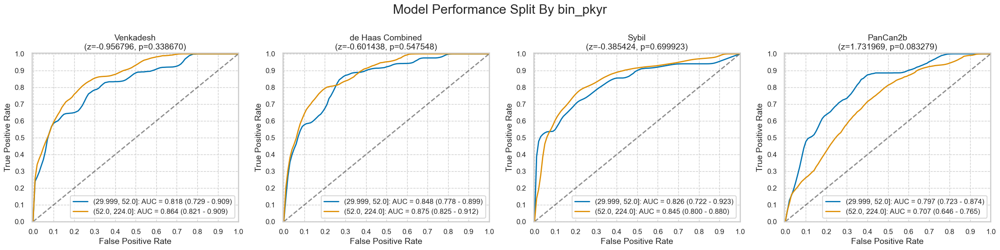

,num,pct,num_mal,pct_mal
"(29.999, 52.0]",601,51.279863,38,6.322795
"(52.0, 224.0]",571,48.720137,89,15.586690


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.956796,-0.601438,-0.385424,1.731969
p,0.338670,0.547548,0.699923,0.083279


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(29.999, 52.0]",601,38,563,30,167,396,8,0.789474,0.296625,0.210526,0.703375,0.152284,0.980198,0.847716,0.019802,0.708819,0.492848,0.255319,0.255526
"(52.0, 224.0]",571,89,482,77,169,313,12,0.865169,0.350622,0.134831,0.649378,0.313008,0.963077,0.686992,0.036923,0.683012,0.514546,0.459701,0.376906


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(29.999, 52.0]",601,38,563,34,218,345,4,0.894737,0.387211,0.105263,0.612789,0.134921,0.988539,0.865079,0.011461,0.630616,0.507525,0.234483,0.250317
"(52.0, 224.0]",571,89,482,81,189,293,8,0.910112,0.392116,0.089888,0.607884,0.300000,0.973422,0.700000,0.026578,0.654991,0.517996,0.451253,0.376340


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(29.999, 52.0]",601,38,563,21,53,510,17,0.552632,0.094139,0.447368,0.905861,0.283784,0.967742,0.716216,0.032258,0.883527,0.458493,0.375000,0.339592
"(52.0, 224.0]",571,89,482,50,43,439,39,0.561798,0.089212,0.438202,0.910788,0.537634,0.918410,0.462366,0.081590,0.856392,0.472586,0.549451,0.464242


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(29.999, 52.0]",601,38,563,28,156,407,10,0.736842,0.277087,0.263158,0.722913,0.152174,0.976019,0.847826,0.023981,0.723794,0.459755,0.252252,0.242770
"(52.0, 224.0]",571,89,482,52,145,337,37,0.584270,0.300830,0.415730,0.699170,0.263959,0.901070,0.736041,0.098930,0.681261,0.283440,0.363636,0.216277


C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeage  \
               count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                 
(4.999, 16.0]  648.0  0.120370  0.325646  0.0  0.0  0.0  0.0  1.0    648.0   
(16.0, 40.0]   524.0  0.093511  0.291426  0.0  0.0  0.0  0.0  1.0    524.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.074074  1.907621   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.330153  2.615545  17.0  18.0  18.0  20.0  40.0

#### bin_smokeage

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


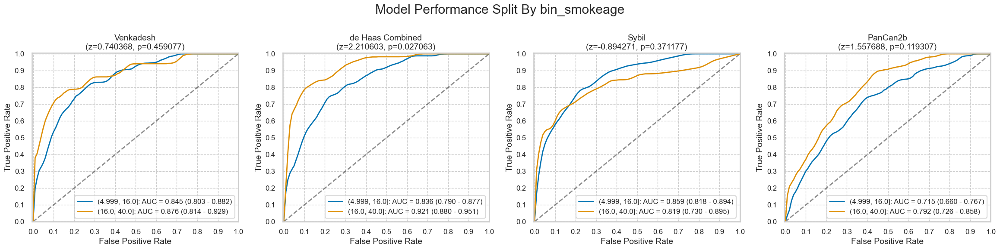

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",648,55.290102,78,12.037037
"(16.0, 40.0]",524,44.709898,49,9.351145


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.740368,2.210603,-0.894271,1.557688
p,0.459077,0.027063,0.371177,0.119307


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(4.999, 16.0]",648,78,570,65,188,382,13,0.833333,0.329825,0.166667,0.670175,0.256917,0.967089,0.743083,0.032911,0.689815,0.503509,0.392749,0.33584
"(16.0, 40.0]",524,49,475,42,148,327,7,0.857143,0.311579,0.142857,0.688421,0.221053,0.979042,0.778947,0.020958,0.704198,0.545564,0.351464,0.33040


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(4.999, 16.0]",648,78,570,68,230,340,10,0.871795,0.403509,0.128205,0.596491,0.228188,0.971429,0.771812,0.028571,0.629630,0.468286,0.361702,0.305741
"(16.0, 40.0]",524,49,475,47,177,298,2,0.959184,0.372632,0.040816,0.627368,0.209821,0.993333,0.790179,0.006667,0.658397,0.586552,0.344322,0.345197


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(4.999, 16.0]",648,78,570,44,51,519,34,0.564103,0.089474,0.435897,0.910526,0.463158,0.938517,0.536842,0.061483,0.868827,0.474629,0.508671,0.436631
"(16.0, 40.0]",524,49,475,27,45,430,22,0.551020,0.094737,0.448980,0.905263,0.375000,0.951327,0.625000,0.048673,0.872137,0.456284,0.446281,0.385873


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(4.999, 16.0]",648,78,570,46,171,399,32,0.589744,0.300000,0.410256,0.700000,0.211982,0.925754,0.788018,0.074246,0.686728,0.289744,0.311864,0.199770
"(16.0, 40.0]",524,49,475,34,130,345,15,0.693878,0.273684,0.306122,0.726316,0.207317,0.958333,0.792683,0.041667,0.723282,0.420193,0.319249,0.263828


C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeday  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                  
(11.999, 25.0]  611.0  0.075286  0.264069  0.0  0.0  0.0  0.0  1.0    611.0   
(25.0, 80.0]    561.0  0.144385  0.351793  0.0  0.0  0.0  0.0  1.0    561.0   

                                                                    
                     mean        std   min   25%   50%   75%   max  
bin_smokeday                                                        
(11.999, 25.0]  20.081833   2.207256  12.0  20.0  20.0  20.0  25.0  
(25.0, 80.0]    38.099822  10.204027  28.0  30.0  40.0  40.0  80.0

#### bin_smokeday

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


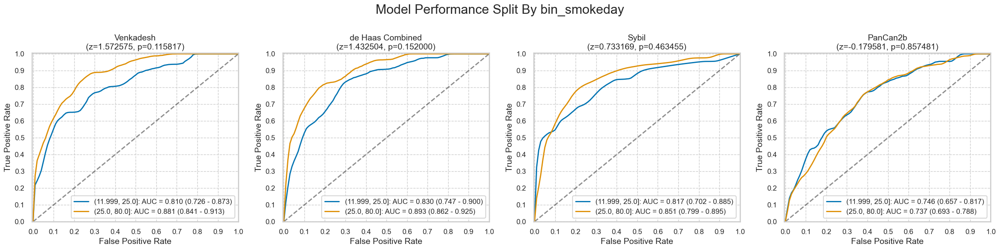

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",611,52.133106,46,7.528642
"(25.0, 80.0]",561,47.866894,81,14.438503


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,1.572575,1.432504,0.733169,-0.179581
p,0.115817,0.152000,0.463455,0.857481


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(11.999, 25.0]",611,46,565,35,173,392,11,0.760870,0.306195,0.239130,0.693805,0.168269,0.972705,0.831731,0.027295,0.698854,0.454675,0.275591,0.253174
"(25.0, 80.0]",561,81,480,72,163,317,9,0.888889,0.339583,0.111111,0.660417,0.306383,0.972393,0.693617,0.027607,0.693405,0.549306,0.455696,0.391322


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(11.999, 25.0]",611,46,565,41,234,331,5,0.891304,0.414159,0.108696,0.585841,0.149091,0.985119,0.850909,0.014881,0.608838,0.477145,0.255452,0.253057
"(25.0, 80.0]",561,81,480,74,173,307,7,0.913580,0.360417,0.086420,0.639583,0.299595,0.977707,0.700405,0.022293,0.679144,0.553164,0.451220,0.391655


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(11.999, 25.0]",611,46,565,25,51,514,21,0.543478,0.090265,0.456522,0.909735,0.328947,0.960748,0.671053,0.039252,0.882160,0.453213,0.409836,0.362344
"(25.0, 80.0]",561,81,480,46,45,435,35,0.567901,0.093750,0.432099,0.906250,0.505495,0.925532,0.494505,0.074468,0.857398,0.474151,0.534884,0.452075


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(11.999, 25.0]",611,46,565,30,168,397,16,0.652174,0.297345,0.347826,0.702655,0.151515,0.961259,0.848485,0.038741,0.698854,0.354829,0.245902,0.200039
"(25.0, 80.0]",561,81,480,50,133,347,31,0.617284,0.277083,0.382716,0.722917,0.273224,0.917989,0.726776,0.082011,0.707665,0.340201,0.378788,0.255051


C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\3728513433.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeyr  \
                count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                  
(16.999, 41.0]  603.0  0.077944  0.268305  0.0  0.0  0.0  0.0  1.0   603.0   
(41.0, 65.0]    569.0  0.140598  0.347912  0.0  0.0  0.0  0.0  1.0   569.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(16.999, 41.0]  35.368159  5.119546  17.0  32.0  37.0  40.0  41.0  
(41.0, 65.0]    47.448155  4.416024  42.0  44.0  46.0  50.0  65.0

#### bin_smokeyr

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


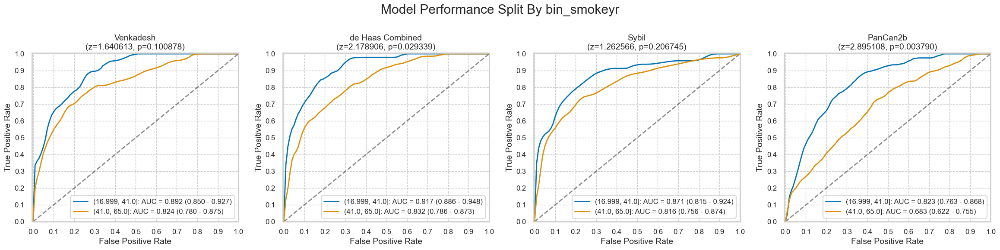

,num,pct,num_mal,pct_mal
"(16.999, 41.0]",603,51.450512,47,7.794362
"(41.0, 65.0]",569,48.549488,80,14.059754


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,1.640613,2.178906,1.262566,2.895108
p,0.100878,0.029339,0.206745,0.003790


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(16.999, 41.0]",603,47,556,42,172,384,5,0.893617,0.309353,0.106383,0.690647,0.196262,0.987147,0.803738,0.012853,0.706468,0.584265,0.321839,0.327351
"(41.0, 65.0]",569,80,489,65,164,325,15,0.812500,0.335378,0.187500,0.664622,0.283843,0.955882,0.716157,0.044118,0.685413,0.477122,0.420712,0.338198


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(16.999, 41.0]",603,47,556,46,203,353,1,0.978723,0.365108,0.021277,0.634892,0.184739,0.997175,0.815261,0.002825,0.661692,0.613615,0.310811,0.334104
"(41.0, 65.0]",569,80,489,69,204,285,11,0.862500,0.417178,0.137500,0.582822,0.252747,0.962838,0.747253,0.037162,0.622144,0.445322,0.390935,0.309846


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(16.999, 41.0]",603,47,556,28,51,505,19,0.595745,0.091727,0.404255,0.908273,0.354430,0.963740,0.645570,0.036260,0.883914,0.504018,0.444444,0.400455
"(41.0, 65.0]",569,80,489,43,45,444,37,0.537500,0.092025,0.462500,0.907975,0.488636,0.923077,0.511364,0.076923,0.855888,0.445475,0.511905,0.428262


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(16.999, 41.0]",603,47,556,34,131,425,13,0.723404,0.235612,0.276596,0.764388,0.206061,0.970320,0.793939,0.029680,0.761194,0.487793,0.320755,0.293321
"(41.0, 65.0]",569,80,489,46,170,319,34,0.575000,0.347648,0.425000,0.652352,0.212963,0.903683,0.787037,0.096317,0.641476,0.227352,0.310811,0.162848


In [20]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

#### Diameter [mm]

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,8.728517,5.254231,4.0,5.50,7.2,9.8,44.4
1,127.0,15.087402,11.924804,4.2,7.95,11.4,17.6,83.0


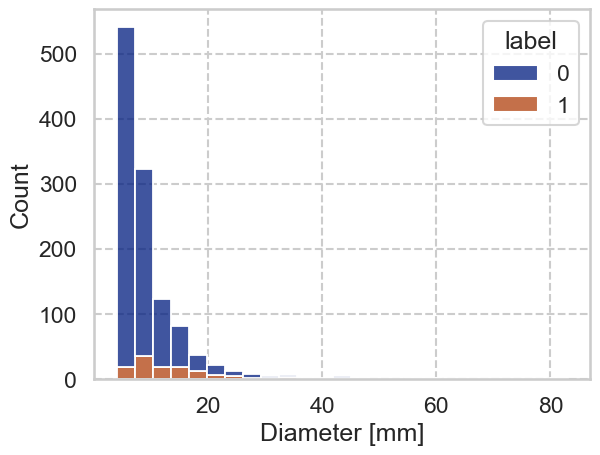

#### NoduleCounts

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,1045.0,1.814354,1.255633,1.0,1.0,1.0,2.0,11.0
1,127.0,2.448819,1.541534,1.0,2.0,2.0,3.0,10.0


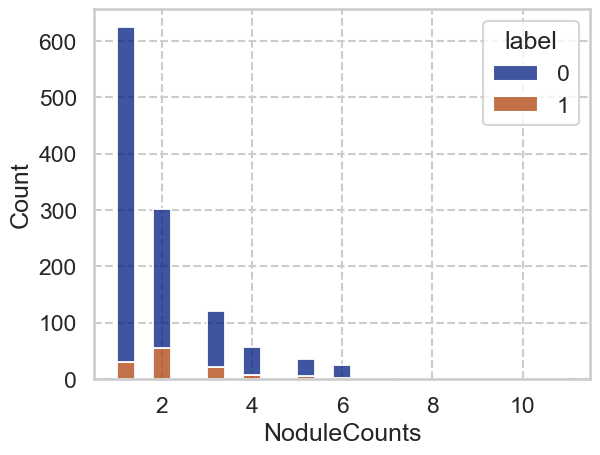

In [21]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    display(Markdown(f"#### {c}"))
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\3226706664.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())


label                                               \
                  count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                       
(0, 1]            625.0  0.049600  0.217291  0.0  0.0  0.0  0.0  1.0   
(1, 12]           547.0  0.175503  0.380745  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0, 1]                  625.0  1.000000  0.000000  1.0  1.0  1.0  1.0   1.0  
(1, 12]                 547.0  2.892139  1.316725  2.0  2.0  2.0  3.0  11.0

#### bin_NoduleCounts

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


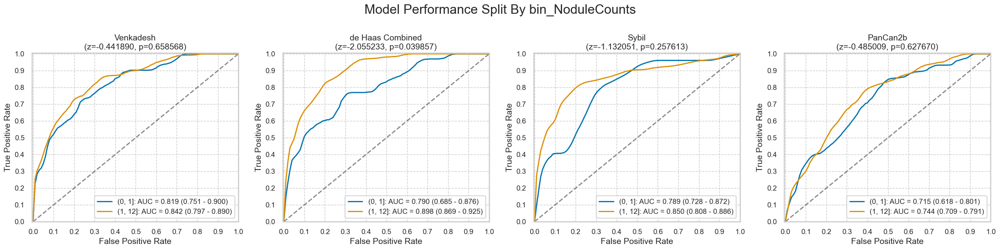

,num,pct,num_mal,pct_mal
"(0, 1]",625,53.327645,31,4.960000
"(1, 12]",547,46.672355,96,17.550274


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,-0.441890,-2.055233,-1.132051,-0.485009
p,0.658568,0.039857,0.257613,0.627670


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(0, 1]",625,31,594,23,157,437,8,0.741935,0.264310,0.258065,0.735690,0.127778,0.982022,0.872222,0.017978,0.736000,0.477626,0.218009,0.229005
"(1, 12]",547,96,451,84,179,272,12,0.875000,0.396896,0.125000,0.603104,0.319392,0.957746,0.680608,0.042254,0.650823,0.478104,0.467967,0.364007


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(0, 1]",625,31,594,24,250,344,7,0.774194,0.420875,0.225806,0.579125,0.087591,0.980057,0.912409,0.019943,0.588800,0.353318,0.157377,0.154601
"(1, 12]",547,96,451,91,157,294,5,0.947917,0.348115,0.052083,0.651885,0.366935,0.983278,0.633065,0.016722,0.703839,0.599801,0.529070,0.458321


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(0, 1]",625,31,594,13,48,546,18,0.419355,0.080808,0.580645,0.919192,0.213115,0.968085,0.786885,0.031915,0.894400,0.338547,0.282609,0.247678
"(1, 12]",547,96,451,58,48,403,38,0.604167,0.106430,0.395833,0.893570,0.547170,0.913832,0.452830,0.086168,0.842779,0.497737,0.574257,0.479017


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(0, 1]",625,31,594,17,163,431,14,0.548387,0.274411,0.451613,0.725589,0.094444,0.968539,0.905556,0.031461,0.716800,0.273976,0.161137,0.131362
"(1, 12]",547,96,451,63,138,313,33,0.656250,0.305987,0.343750,0.694013,0.313433,0.904624,0.686567,0.095376,0.687386,0.350263,0.424242,0.276365


In [22]:
# for c in included_num_cols:
#     nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
#     display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
#     plot_by_category(nlst_preds, f'bin_{c}')
nlst_preds['bin_NoduleCounts'] = pd.cut(nlst_preds['NoduleCounts'], bins=[0, 1, 12], right=True)
display(nlst_preds.groupby(f'bin_NoduleCounts')[['label', f'NoduleCounts']].describe())
plot_by_category(nlst_preds, f'bin_NoduleCounts')

C:\Users\shaur\AppData\Local\Temp\ipykernel_15960\3128368612.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())


label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                       
(3.999, 7.5]       598.0  0.045151  0.207808  0.0  0.0  0.0  0.0  1.0   
(7.5, 83.0]        574.0  0.174216  0.379626  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                             \
                          count       mean       std  min  25%   50%   75%   
bin_Diameter [mm]                                                            
(3.999, 7.5]              598.0   5.679599  1.016325  4.0  4.8   5.7   6.5   
(7.5, 83.0]               574.0  13.311847  7.662230  7.6  8.8  10.9  14.9   

                         
                    max  
bin_Diameter [mm]        
(3.999, 7.5]        7.5  
(7.5, 83.0]        83.0

#### bin_Diameter [mm]

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:238: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


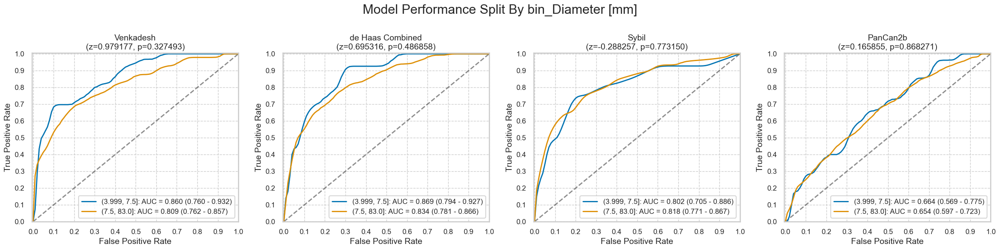

,num,pct,num_mal,pct_mal
"(3.999, 7.5]",598,51.023891,27,4.515050
"(7.5, 83.0]",574,48.976109,100,17.421603


Hanley-McNeil significance test results:


,Venkadesh,de Haas Combined,Sybil,PanCan2b
z,0.979177,0.695316,-0.288257,0.165855
p,0.327493,0.486858,0.773150,0.868271


Venkadesh


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(3.999, 7.5]",598,27,571,19,71,500,8,0.703704,0.124343,0.296296,0.875657,0.211111,0.984252,0.788889,0.015748,0.867893,0.579360,0.324786,0.336431
"(7.5, 83.0]",574,100,474,88,265,209,12,0.880000,0.559072,0.120000,0.440928,0.249292,0.945701,0.750708,0.054299,0.517422,0.320928,0.388521,0.250158


de Haas Combined


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(3.999, 7.5]",598,27,571,21,147,424,6,0.777778,0.257443,0.222222,0.742557,0.125000,0.986047,0.875000,0.013953,0.744147,0.520335,0.215385,0.240378
"(7.5, 83.0]",574,100,474,94,260,214,6,0.940000,0.548523,0.060000,0.451477,0.265537,0.972727,0.734463,0.027273,0.536585,0.391477,0.414097,0.305409


Sybil


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(3.999, 7.5]",598,27,571,6,10,561,21,0.222222,0.017513,0.777778,0.982487,0.375000,0.963918,0.625000,0.036082,0.948161,0.204709,0.279070,0.263400
"(7.5, 83.0]",574,100,474,65,86,388,35,0.650000,0.181435,0.350000,0.818565,0.430464,0.917258,0.569536,0.082742,0.789199,0.468565,0.517928,0.403646


PanCan2b


,num,mal,ben,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc,j,f1,mcc
"(3.999, 7.5]",598,27,571,0,6,565,27,0.0,0.010508,1.0,0.989492,0.000000,0.954392,1.000000,0.045608,0.944816,-0.010508,0.000000,-0.021892
"(7.5, 83.0]",574,100,474,80,295,179,20,0.8,0.622363,0.2,0.377637,0.213333,0.899497,0.786667,0.100503,0.451220,0.177637,0.336842,0.141573


In [23]:
nlst_preds['bin_Diameter [mm]'] = pd.qcut(nlst_preds['Diameter [mm]'], q=2)
display(nlst_preds.groupby(f'bin_Diameter [mm]')[['label', f'Diameter [mm]']].describe())
plot_by_category(nlst_preds, f'bin_Diameter [mm]')